In [3]:
import pandas as pd
df = pd.read_csv('structured_data.csv')
df

,RxDevice,FileID,TxDevice,Gentime,TxRandom,MsgCount,DSecond,Latitude,Longitude,Elevation,...,RadiusOfCurve,Confidence,Image,NumDetected,Class,Score,xmin,xmax,ymin,ymax
0,10204.0,1834.0,10204.0,3.285337e+14,9520.0,89.0,26400.0,42.298126,-83.703300,232.39999,...,0.000000,0.0,2524.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,10204.0,1834.0,10204.0,3.285337e+14,9520.0,90.0,26800.0,42.298126,-83.703293,231.89999,...,0.000000,0.0,2525.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,10204.0,1834.0,10204.0,3.285337e+14,9520.0,91.0,27000.0,42.298126,-83.703285,231.70000,...,0.000000,0.0,2526.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,10204.0,1834.0,10204.0,3.285337e+14,9520.0,92.0,27100.0,42.298126,-83.703285,231.70000,...,0.000000,0.0,2527.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,10204.0,1834.0,10204.0,3.285337e+14,9520.0,93.0,27200.0,42.298126,-83.703285,231.50000,...,0.000000,0.0,2528.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
5,10204.0,1834.0,10204.0,3.285337e+14,9520.0,94.0,27300.0,42.298126,-83.703285,231.50000,...,0.000000,0.0,2529.0,1.0,1.0,0.300683,0.458107,0.505319,0.196417,0.598651
6,10204.0,1834.0,10204.0,3.285337e+14,9520.0,95.0,27400.0,42.298126,-83.703285,231.30000,...,0.000000,0.0,2530.0,1.0,44.0,0.344447,0.713538,0.748476,0.180869,0.394960
7,10204.0,1834.0,10204.0,3.285337e+14,9520.0,96.0,27500.0,42.298126,-83.703285,231.30000,...,0.000000,0.0,2531.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
8,10204.0,1834.0,10204.0,3.285337e+14,9520.0,97.0,27600.0,42.298126,-83.703278,231.20000,...,0.000000,0.0,2532.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
9,10204.0,1834.0,10204.0,3.285337e+14,9520.0,98.0,27700.0,42.298126,-83.703278,231.20000,...,0.000000,0.0,2533.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df['Class'].plot(kind='hist')

In [5]:
classes = []
for index, row in df.iterrows():
    entry = df['Class'][index]
    if not pd.isna(entry):
        if entry not in classes:
            classes.append(df['Class'][index])
        
classes.sort()
classes

[1.0,
 2.0,
 3.0,
 4.0,
 5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 10.0,
 11.0,
 13.0,
 14.0,
 15.0,
 16.0,
 17.0,
 18.0,
 21.0,
 23.0,
 27.0,
 28.0,
 31.0,
 32.0,
 33.0,
 38.0,
 39.0,
 43.0,
 44.0,
 47.0,
 51.0,
 62.0,
 64.0,
 65.0,
 72.0,
 74.0,
 76.0,
 78.0,
 81.0,
 85.0,
 90.0]

In [6]:
labels = df.columns
length = len(df)
image = 0
index = 0
ground = {}

while index < length:
    num = int(df['NumDetected'][index])
    d = {'num': num}
    if num == 0:
        num = 1
    elif num == 1:
        dd = {'Class': df['Class'][index], 'Score': df['Score'][index], 'xmin': df['xmin'][index],
              'xmax': df['xmax'][index], 'ymin': df['ymin'][index], 'ymax':df['ymax'][index]}
        d.update({'1':dd})
    else:
        for k in range(num):
            temp = index + k
            dd = {'Class': df['Class'][temp], 'Score': df['Score'][temp], 'xmin': df['xmin'][temp],
                  'xmax': df['xmax'][temp],'ymin': df['ymin'][temp], 'ymax':df['ymax'][temp]}
            d.update({str(k+1): dd})
    ground.update({str(image): d})
    image = image + 1
    index = index + num

In [7]:
# ground = {instance: images}
# images = {'num': n, '1': image_dict_1, ... , 'n': image_dict_n}
# image_dict = {'Class': a, 'Score': b, 'xmin': c, 'xmax': d, 'ymin': e, 'ymax': f}
ground
    

{'0': {'num': 0},
 '1': {'num': 0},
 '2': {'num': 0},
 '3': {'num': 0},
 '4': {'num': 0},
 '5': {'1': {'Class': 1.0,
   'Score': 0.3006827,
   'xmax': 0.5053194999999999,
   'xmin': 0.45810688,
   'ymax': 0.598651,
   'ymin': 0.19641653},
  'num': 1},
 '6': {'1': {'Class': 44.0,
   'Score': 0.34444709999999995,
   'xmax': 0.7484761999999999,
   'xmin': 0.7135379,
   'ymax': 0.3949599,
   'ymin': 0.18086879},
  'num': 1},
 '7': {'num': 0},
 '8': {'num': 0},
 '9': {'num': 0},
 '10': {'num': 0},
 '11': {'num': 0},
 '12': {'num': 0},
 '13': {'num': 0},
 '14': {'num': 0},
 '15': {'num': 0},
 '16': {'num': 0},
 '17': {'num': 0},
 '18': {'num': 0},
 '19': {'num': 0},
 '20': {'num': 0},
 '21': {'num': 0},
 '22': {'num': 0},
 '23': {'num': 0},
 '24': {'num': 0},
 '25': {'num': 0},
 '26': {'num': 0},
 '27': {'num': 0},
 '28': {'num': 0},
 '29': {'num': 0},
 '30': {'num': 0},
 '31': {'num': 0},
 '32': {'num': 0},
 '33': {'num': 0},
 '34': {'num': 0},
 '35': {'num': 0},
 '36': {'num': 0},
 '37': {

In [8]:
frames = {}

for obj_class in classes:
    contained = []
    for key in ground:
        image = ground[key]
        num = image['num']
        if num > 0:
            for k in range(1, num+1):
                curr_class = image[str(k)]['Class']
                if curr_class == obj_class:
                    contained.append(int(key))
                    break
    frames[obj_class] = contained

for key in frames:
    print(key)
    print(frames[key])
    print('')
    

1.0
[5, 53, 58, 59, 65, 67, 68, 71, 73, 78, 79, 80, 81, 82, 83, 84, 85, 90, 91, 92, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 182, 296, 297, 298, 313, 315, 316, 317, 325, 326, 391, 392, 396, 428, 441, 446, 448, 458, 464, 507, 542, 580, 602, 605, 655, 669, 685, 689, 694, 696, 700, 737, 770, 780, 786, 798, 838, 858, 882, 893, 907, 986, 988, 1008, 1009, 1019, 1020, 1023, 1028, 1029, 1050, 1051, 1052, 1229, 1257, 1258, 1259, 1260, 1262, 1273, 1275, 1279, 1299, 1302, 1304, 1306, 1307, 1315, 1317, 1321, 1325, 1329, 1331, 1332, 1333, 1334, 1343, 1352, 1526, 1532, 1533, 1534, 1535, 1544, 1546, 1547, 1548, 1549, 1552, 1569, 1570, 1582, 1586, 1587, 1594, 1602, 1603, 1623, 1626, 1627, 1632, 1636, 1638, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1647, 1654, 1655, 1657, 1658, 1659, 1660, 1662, 1665, 1673, 1798, 2036, 2120, 2121, 2124, 2158, 2163, 2164, 2202, 2203, 2220, 2224, 2235, 2242, 2245, 2246, 2249, 2250, 2251, 2258, 2260, 22

In [20]:
class_ground = {}

for key in frames:
    images = frames[key]    
    data = []
    
    for image in images:
        info = ground[str(image)]
        num = info['num']
        wrapper_d = {}
        temp_d = {}
        count = 1
        for i in range(1, num + 1):
            if info[str(i)]['Class'] == key:
                obj_d = {}
                obj_d['Score'] = info[str(i)]['Score']
                obj_d['xmin'] = info[str(i)]['xmin']
                obj_d['xmax'] = info[str(i)]['xmax']
                obj_d['ymin'] = info[str(i)]['ymin']
                obj_d['ymax'] = info[str(i)]['ymax']
                temp_d[count] = obj_d
                count = count + 1
        wrapper_d['num'] = count - 1
        wrapper_d['frame'] = image
        wrapper_d['data'] = temp_d
        data.append(wrapper_d)

    class_ground[key] = data

class_ground

{1.0: [{'data': {1: {'Score': 0.3006827,
     'xmax': 0.5053194999999999,
     'xmin': 0.45810688,
     'ymax': 0.598651,
     'ymin': 0.19641653}},
   'frame': 5,
   'num': 1},
  {'data': {1: {'Score': 0.3869278,
     'xmax': 0.4873846,
     'xmin': 0.44780847,
     'ymax': 0.5571235999999999,
     'ymin': 0.22155100000000005}},
   'frame': 53,
   'num': 1},
  {'data': {1: {'Score': 0.3734276,
     'xmax': 0.4911399,
     'xmin': 0.45045835,
     'ymax': 0.57791084,
     'ymin': 0.23116842}},
   'frame': 58,
   'num': 1},
  {'data': {1: {'Score': 0.5246757,
     'xmax': 0.48836035,
     'xmin': 0.44884026,
     'ymax': 0.5646329000000001,
     'ymin': 0.22333556}},
   'frame': 59,
   'num': 1},
  {'data': {1: {'Score': 0.8019135000000001,
     'xmax': 0.48125604,
     'xmin': 0.43703678,
     'ymax': 0.6091840999999999,
     'ymin': 0.21586235}},
   'frame': 65,
   'num': 1},
  {'data': {1: {'Score': 0.78372085,
     'xmax': 0.47932488,
     'xmin': 0.43788975,
     'ymax': 0.60110104

In [80]:
# for key in class_ground:
#     print(key)
# #     print(class_ground[key])
#     print('')

class_ground[1.0]

[{'data': {1: {'Score': 0.3006827,
    'frame': 5,
    'xmax': 0.5053194999999999,
    'xmin': 0.45810688,
    'ymax': 0.598651,
    'ymin': 0.19641653}},
  'frame': 5,
  'num': 1},
 {'data': {1: {'Score': 0.3869278,
    'frame': 53,
    'xmax': 0.4873846,
    'xmin': 0.44780847,
    'ymax': 0.5571235999999999,
    'ymin': 0.22155100000000005}},
  'frame': 53,
  'num': 1},
 {'data': {1: {'Score': 0.3734276,
    'xmax': 0.4911399,
    'xmin': 0.45045835,
    'ymax': 0.57791084,
    'ymin': 0.23116842}},
  'frame': 58,
  'num': 1},
 {'data': {1: {'Score': 0.5246757,
    'xmax': 0.48836035,
    'xmin': 0.44884026,
    'ymax': 0.5646329000000001,
    'ymin': 0.22333556}},
  'frame': 59,
  'num': 1},
 {'data': {1: {'Score': 0.8019135000000001,
    'frame': 65,
    'xmax': 0.48125604,
    'xmin': 0.43703678,
    'ymax': 0.6091840999999999,
    'ymin': 0.21586235}},
  'frame': 65,
  'num': 1},
 {'data': {1: {'Score': 0.78372085,
    'xmax': 0.47932488,
    'xmin': 0.43788975,
    'ymax': 0.60

In [86]:
data = class_ground[1.0]
for image in data:
    print(image)
    print('')

{'num': 1, 'frame': 5, 'data': {1: {'Score': 0.3006827, 'xmin': 0.45810688, 'xmax': 0.5053194999999999, 'ymin': 0.19641653, 'ymax': 0.598651, 'frame': 5}}}

{'num': 1, 'frame': 53, 'data': {1: {'Score': 0.3869278, 'xmin': 0.44780847, 'xmax': 0.4873846, 'ymin': 0.22155100000000005, 'ymax': 0.5571235999999999, 'frame': 53}}}

{'num': 1, 'frame': 58, 'data': {1: {'Score': 0.3734276, 'xmin': 0.45045835, 'xmax': 0.4911399, 'ymin': 0.23116842, 'ymax': 0.57791084, 'frame': 58}}}

{'num': 1, 'frame': 59, 'data': {1: {'Score': 0.5246757, 'xmin': 0.44884026, 'xmax': 0.48836035, 'ymin': 0.22333556, 'ymax': 0.5646329000000001, 'frame': 59}}}

{'num': 1, 'frame': 65, 'data': {1: {'Score': 0.8019135000000001, 'xmin': 0.43703678, 'xmax': 0.48125604, 'ymin': 0.21586235, 'ymax': 0.6091840999999999, 'frame': 65}}}

{'num': 1, 'frame': 67, 'data': {1: {'Score': 0.78372085, 'xmin': 0.43788975, 'xmax': 0.47932488, 'ymin': 0.20930053, 'ymax': 0.60110104, 'frame': 67}}}

{'num': 1, 'frame': 68, 'data': {1: {

{'num': 1, 'frame': 6384, 'data': {1: {'Score': 0.4611458, 'xmin': 0.5555680000000001, 'xmax': 0.57598925, 'ymin': 0.1892486, 'ymax': 0.34037203, 'frame': 6384}}}

{'num': 1, 'frame': 6389, 'data': {1: {'Score': 0.35657504, 'xmin': 0.30338678, 'xmax': 0.31927553, 'ymin': 0.26129666, 'ymax': 0.37071016, 'frame': 6389}}}

{'num': 1, 'frame': 6394, 'data': {1: {'Score': 0.4290649, 'xmin': 0.1640557, 'xmax': 0.18814209, 'ymin': 0.16588116, 'ymax': 0.2877617, 'frame': 6394}}}

{'num': 2, 'frame': 6396, 'data': {1: {'Score': 0.72141194, 'xmin': 0.28020468, 'xmax': 0.2962425, 'ymin': 0.27607915, 'ymax': 0.40311345, 'frame': 6396}, 2: {'Score': 0.3592904000000001, 'xmin': 0.28993788, 'xmax': 0.30501458, 'ymin': 0.27969238, 'ymax': 0.40084743, 'frame': 6396}}}

{'num': 1, 'frame': 6400, 'data': {1: {'Score': 0.66141015, 'xmin': 0.25970402, 'xmax': 0.27898493, 'ymin': 0.26542264, 'ymax': 0.4291969, 'frame': 6400}}}

{'num': 2, 'frame': 6405, 'data': {1: {'Score': 0.55239606, 'xmin': 0.47584262, 

In [103]:
# Sequential Object Naming

data = {}
for obj_type in class_ground:
    print(obj_type)
    test = class_ground[obj_type]
    obj_num = 1
    count = 0
    objects = {}
    curr = {}

    for frame in test:
        print(frame['frame'])
        if count == 0:
            for i in range(1, frame['num'] + 1):
                name = 'obj-' + str(obj_type) + '-' + str(obj_num)   
                d = frame['data'][i]
                f = frame['frame']
                info = {f: d}
                objects[name] = [info]
                curr[name] = d
                curr[name]['frame'] = f
                obj_num = obj_num + 1

        else:
            for i in range(1, frame['num'] + 1):
                unnamed = True
                for key in curr:                
                    curr_data = curr[key]    
                    if curr_data['frame'] == frame['frame']:
                        continue

                    xmin_diff = abs(curr_data['xmin'] - frame['data'][i]['xmin']) / curr_data['xmin'] * 100
                    xmax_diff = abs(curr_data['xmax'] - frame['data'][i]['xmax']) / curr_data['xmax'] * 100
                    ymin_diff = abs(curr_data['ymin'] - frame['data'][i]['ymin']) / curr_data['ymin'] * 100
                    ymax_diff = abs(curr_data['ymax'] - frame['data'][i]['ymax']) / curr_data['ymax'] * 100
                    frame_diff = frame['frame'] - curr_data['frame']

                    if frame_diff <= 10:
                        if (xmin_diff < (10 + frame_diff) and xmax_diff < (10 + frame_diff) or 
                             (ymin_diff < (10 + frame_diff) and ymax_diff < (10 + frame_diff))):
                            d = frame['data'][i]
                            f = frame['frame']
                            info = {f: d}
                            objects[key].append(info)
                            curr[key] = d
                            curr[key]['frame'] = f
                            unnamed = False
                            break

                if unnamed:
                    name = 'obj-' + str(obj_type) + '-' + str(obj_num)   
                    d = frame['data'][i]
                    f = frame['frame']
                    info = {f: d}
                    objects[name] = [info]
                    curr[name] = d
                    curr[name]['frame'] = f
                    obj_num = obj_num + 1

        count = count + 1 
    data[obj_type] = objects

# for key in data:
#     print(key)
#     print(data[key])
#     print('')

1.0
5
53
58
59
65
67
68
71
73
78
79
80
81
82
83
84
85
90
91
92
96
97
98
99
100
101
102
103
104
105
107
108
109
110
111
112
113
114
115
116
117
118
119
182
296
297
298
313
315
316
317
325
326
391
392
396
428
441
446
448
458
464
507
542
580
602
605
655
669
685
689
694
696
700
737
770
780
786
798
838
858
882
893
907
986
988
1008
1009
1019
1020
1023
1028
1029
1050
1051
1052
1229
1257
1258
1259
1260
1262
1273
1275
1279
1299
1302
1304
1306
1307
1315
1317
1321
1325
1329
1331
1332
1333
1334
1343
1352
1526
1532
1533
1534
1535
1544
1546
1547
1548
1549
1552
1569
1570
1582
1586
1587
1594
1602
1603
1623
1626
1627
1632
1636
1638
1640
1641
1642
1643
1644
1645
1646
1647
1654
1655
1657
1658
1659
1660
1662
1665
1673
1798
2036
2120
2121
2124
2158
2163
2164
2202
2203
2220
2224
2235
2242
2245
2246
2249
2250
2251
2258
2260
2285
2306
2309
2310
2312
2315
2321
2322
2325
2326
2329
2332
2334
2335
2346
2378
2379
2380
2381
2382
2384
2386
2388
2406
2415
2416
2417
2418
2419
2420
2421
2424
2425
2426
2428
2430
2434
24

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in double_scalars



4328
4336
4337
4350
4351
4356
4359
4410
4411
4412
4413
4414
4415
4416
4417
4418
4419
4470
4472
4476
4480
4481
4482
4483
4484
4485
4486
4487
4496
4513
4532
4547
4548
4570
4571
4572
4574
4578
4579
4583
4586
4587
4594
4596
4601
4605
4606
4610
4625
4631
4638
4640
4642
4644
4646
4651
4663
4671
4672
4673
4679
4682
4684
4703
4706
4710
4718
4742
4759
4760
4791
4793
4794
4800
4815
4825
4834
4836
4845
4846
4862
4895
4946
4952
4954
4961
4974
5052
5066
5077
5125
5156
5160
5220
5289
5345
5405
5473
5475
5502
5503
5509
5521
5591
5592
5593
5602
5616
5665
5690
5693
5723
5753
5754
5756
5758
5759
5760
5763
5772
5774
5782
5790
5796
5797
5816
5818
5830
5834
5835
5840
5854
5855
5860
5863
5864
5865
5868
5873
5907
5908
5914
5917
5929
5936
5937
5948
5953
5976
5984
6003
6046
6048
6052
6053
6114
6136
6201
6214
6320
6331
6332
6338
6340
6343
6384
6389
6394
6396
6400
6405
6410
6411
6416
6419
6425
6426
6427
6429
6430
6431
6432
6435
6439
6440
6476
6477
6492
6511
6514
6589
6592
6595
6597
6598
6612
6615
6618
6619
6624

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in double_scalars
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars



1183
1188
1200
1208
1209
1210
1211
1213
1214
1217
1221
1222
1223
1224
1225
1230
1231
1232
1233
1234
1235
1236
1237
1242
1243
1244
1245
1246
1247
1248
1249
1250
1251
1252
1253
1254
1255
1256
1257
1258
1259
1260
1261
1262
1263
1264
1265
1266
1267
1268
1269
1270
1271
1272
1273
1274
1275
1276
1277
1278
1279
1280
1281
1282
1283
1284
1285
1286
1287
1288
1289
1290
1291
1292
1293
1294
1295
1296
1297
1298
1299
1300
1301
1302
1303
1304
1305
1306
1307
1308
1309
1310
1311
1312
1313
1314
1315
1316
1317
1318
1319
1320
1321
1322
1323
1324
1325
1326
1327
1328
1329
1330
1331
1332
1333
1334
1335
1336
1337
1338
1339
1340
1341
1342
1343
1344
1345
1346
1347
1348
1349
1350
1351
1352
1353
1354
1355
1356
1357
1358
1359
1360
1361
1362
1363
1364
1365
1366
1367
1368
1369
1370
1371
1372
1373
1374
1375
1376
1377
1378
1379
1380
1381
1382
1383
1384
1385
1386
1387
1388
1389
1390
1391
1392
1393
1394
1395
1396
1397
1398
1399
1400
1401
1402
1403
1404
1405
1406
1407
1408
1409
1410
1411
1412
1413
1414
1415
1416
1417
1418

3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3573
3574
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3711
3712
3713
3715
3716
3717
3718
3719
3720
3727
3728
3729
3730
3731
3732
3733
3734
3736
3738
3739
3740
3741
3743
3748
3749
3750
3752
3753
3755
3757
3759
3765
3766
3767
3768
3769
3771
3772
3773
3774
3775
3776
3777
3779
3780
3781
3782
3783
3784
3785
3786
3787
3789
3791
3792
3793
3794


5592
5593
5594
5595
5596
5597
5598
5599
5600
5601
5602
5603
5604
5605
5606
5607
5609
5610
5612
5614
5616
5617
5618
5620
5621
5623
5624
5625
5626
5627
5629
5630
5631
5632
5633
5634
5635
5636
5637
5638
5639
5640
5641
5642
5643
5644
5645
5646
5647
5648
5649
5650
5651
5652
5653
5654
5655
5656
5657
5658
5659
5660
5661
5662
5663
5664
5665
5666
5667
5668
5669
5670
5671
5672
5673
5674
5675
5676
5677
5678
5679
5680
5681
5682
5683
5684
5685
5686
5687
5688
5689
5690
5691
5692
5693
5694
5695
5696
5697
5698
5699
5700
5701
5702
5703
5704
5705
5706
5707
5708
5709
5710
5711
5712
5713
5714
5715
5716
5717
5718
5719
5720
5721
5722
5723
5724
5725
5726
5727
5728
5729
5730
5731
5733
5734
5735
5736
5737
5738
5739
5740
5741
5742
5743
5744
5745
5746
5747
5748
5749
5750
5751
5752
5753
5754
5755
5756
5757
5758
5759
5760
5761
5762
5763
5764
5765
5766
5767
5768
5769
5770
5771
5772
5773
5774
5775
5776
5777
5778
5779
5780
5781
5782
5783
5784
5785
5786
5787
5788
5789
5790
5791
5792
5793
5794
5795
5796
5797
5798
5799


7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
7308
7309
7310
7311
7312
7313
7314
7315
7316
7317
7318
7319
7320
7321
7322
7323
7324
7325
7326
7327
7328
7329
7330
7331
7332
7333
7334
7335
7336
7337
7338
7339
7340
7341
7342
7343
7344
7345
7346
7347
7348
7349
7350
7351
7352
7353
7354
7355
7356
7357
7358
7359
7360
7361
7362
7363
7364
7365
7366
7367
7368
7369
7370
7371
7372
7373
7374
7375
7376
7377
7378
7379
7380
7381
7382
7383
7384
7385
7386
7387
7388
7389
7390
7391
7392
7393
7394
7395
7396
7397
7398
7399
7400
7401
7402
7403
7404
7405
7406
7407
7408
7409
7410
7411
7412
7413
7414
7415
7416
7417
7418
7419
7420
7421
7422
7423
7424
7425
7426
7427
7428
7429
7430
7431
7432
7433
7434
7435
7436
7437
7438
7439
7440
7441
7442
7443
7444
7445
7446
7447
7448
7449
7450
7451
7452
7453
7454
7455
7456
7457
7458
7459
7460
7461


9887
9888
9889
9890
9891
9892
9893
9894
9895
9896
9897
9898
9899
9900
9901
9902
9903
9904
9905
9906
9907
9908
9909
9910
9911
9912
9913
9914
9915
9916
9917
9918
9919
9920
9921
9922
9923
9924
9925
9926
9927
9928
9929
9930
9931
9932
9933
9935
9937
9938
9939
9940
9941
9942
9943
9944
9945
9946
9947
9949
9950
9952
9953
9956
9957
9959
9965
9967
9968
9969
9970
9971
9973
9976
9980
9983
9986
9987
9989
9990
9992
9993
9994
9995
9996
9997
9998
9999
10000
10001
10002
10003
10004
10005
10006
10007
10008
10009
10010
10011
10012
10013
10014
10015
10016
10017
10018
10019
10020
10021
10022
10023
10024
10025
10026
10027
10029
10030
10031
10032
10033
10034
10035
10036
10037
10038
10039
10040
10041
10042
10043
10044
10045
10046
10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10069
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10

2155
2156
2157
2158
2159
2160
2161
2163
2165
2166
2167
2170
2172
2173
2175
2184
2187
2188
2189
2190
2191
2194
2195
2198
2199
2205
2206
2208
2209
2211
2212
2216
2217
2228
2235
2250
2294
2295
2296
2305
2306
2307
2308
2316
2319
2322
2324
2325
2365
2366
2369
2370
2371
2372
2373
2374
2375
2376
2377
2378
2379
2381
2382
2383
2384
2385
2395
2406
2417
2419
2420
2421
2422
2424
2425
2426
2460
2585
2586
2588
2591
2593
2594
2599
2601
2604
2606
2607
2608
2609
2610
2611
2612
2613
2614
2615
2617
2618
2619
2620
2622
2623
2626
2627
2628
2629
2630
2631
2632
2633
2634
2635
2638
2639
2641
2646
2647
2648
2649
2651
2654
2655
2656
2657
2658
2659
2660
2661
2662
2663
2664
2665
2666
2667
2668
2669
2670
2671
2672
2673
2674
2675
2676
2677
2678
2679
2680
2681
2682
2683
2685
2686
2688
2689
2690
2693
2694
2695
2696
2697
2698
2699
2701
2702
2703
2704
2705
2706
2707
2708
2709
2710
2711
2713
2716
2726
2727
2728
2729
2730
2737
2740
2742
2745
2750
2751
2752
2760
2761
2762
2763
2764
2767
2768
2769
2770
2771
2774
2775
2776


11262
11263
11264
11267
11268
11285
11296
11300
11301
11302
11304
11305
11306
11307
11308
11309
11310
11311
11313
11314
11315
11316
11317
11318
11319
11320
11321
11323
11324
11366
11374
11375
11376
11382
11386
11388
11412
11446
11449
11454
11458
11461
11505
11511
11518
11521
11536
11544
11552
11565
11567
11569
11570
11571
11572
11574
11575
11737
11746
11747
11749
11752
11755
11758
11759
11761
11762
11767
11768
11770
11771
11778
11781
11782
11783
11784
11785
11787
11789
11790
11791
11792
11794
11795
11797
11799
11800
11802
11816
11831
11837
11844
11846
11847
11850
11852
11853
11855
11859
11865
11867
11868
11870
11871
11876
11877
11878
11879
11882
11883
11884
11885
11886
11889
11890
11892
11893
11894
11897
11898
11908
11918
11919
11920
11921
11922
11923
11924
11925
11926
11928
11929
11931
11933
11934
11936
11937
11938
11939
11940
11941
11943
11945
11947
11961
11963
11976
11981
11984
11985
11986
11988
11989
11991
11992
11995
12010
12012
12013
12015
12020
12025
12026
12027
12028
12041
1204

7423
7424
7425
7426
7427
7428
7429
7430
7431
7432
7433
7434
7435
7436
7437
7438
7439
7440
7441
7442
7443
7444
7445
7446
7447
7448
7449
7450
7451
7454
7457
7458
7459
7460
7461
7462
7465
7466
7467
7468
7469
7472
7473
7474
7475
7490
7494
7495
7496
7497
7498
7499
7500
7501
7502
7503
7504
7505
7508
7512
7513
7515
7516
7517
7518
7519
7520
7521
7523
7525
7526
7528
7529
7530
7532
7533
7534
7535
7536
7538
7539
7541
7544
7545
7546
7549
7550
7552
7564
7573
7574
7578
7581
7583
7584
7587
7588
7589
7591
7594
7595
7596
7597
7599
7601
7602
7603
7605
7606
7607
7608
7621
7622
7623
7624
7625
7630
7633
7642
7644
7645
7646
7647
7648
7649
7650
7653
7654
7657
7658
7668
7685
7687
7689
7691
7699
7701
7714
7726
7861
7866
7993
7996
7997
7998
8001
8018
8036
8046
8050
8052
8055
8056
8057
8064
8065
8067
8069
8070
8071
8072
8074
8076
8079
8180
8218
8246
8256
8264
8325
8511
8516
8517
8532
8536
8537
8539
8548
8552
8553
8554
8560
8562
8563
8610
8734
8779
8794
8837
8873
8878
8914
8921
8936
8942
8944
8945
8947
8948
8949


In [ ]:
data

In [126]:
temp_info = data[1.0]

for name in temp_info:
    print(name)    
    for frame in temp_info[name]:
        print(frame)
        for key in frame:
            print(key)
            print(frame[key])
        print('')


obj-1.0-1
{5: {'Score': 0.3006827, 'xmin': 0.45810688, 'xmax': 0.5053194999999999, 'ymin': 0.19641653, 'ymax': 0.598651, 'frame': 5}}
5
{'Score': 0.3006827, 'xmin': 0.45810688, 'xmax': 0.5053194999999999, 'ymin': 0.19641653, 'ymax': 0.598651, 'frame': 5}

obj-1.0-2
{53: {'Score': 0.3869278, 'xmin': 0.44780847, 'xmax': 0.4873846, 'ymin': 0.22155100000000005, 'ymax': 0.5571235999999999, 'frame': 53}}
53
{'Score': 0.3869278, 'xmin': 0.44780847, 'xmax': 0.4873846, 'ymin': 0.22155100000000005, 'ymax': 0.5571235999999999, 'frame': 53}

{58: {'Score': 0.3734276, 'xmin': 0.45045835, 'xmax': 0.4911399, 'ymin': 0.23116842, 'ymax': 0.57791084, 'frame': 58}}
58
{'Score': 0.3734276, 'xmin': 0.45045835, 'xmax': 0.4911399, 'ymin': 0.23116842, 'ymax': 0.57791084, 'frame': 58}

{59: {'Score': 0.5246757, 'xmin': 0.44884026, 'xmax': 0.48836035, 'ymin': 0.22333556, 'ymax': 0.5646329000000001, 'frame': 59}}
59
{'Score': 0.5246757, 'xmin': 0.44884026, 'xmax': 0.48836035, 'ymin': 0.22333556, 'ymax': 0.564632

2542
{'Score': 0.81360817, 'xmin': 0.56442535, 'xmax': 0.60149646, 'ymin': 0.27103668, 'ymax': 0.4509191, 'frame': 2542}

{2543: {'Score': 0.7850956, 'xmin': 0.5862, 'xmax': 0.60274637, 'ymin': 0.27214858, 'ymax': 0.41849336, 'frame': 2543}}
2543
{'Score': 0.7850956, 'xmin': 0.5862, 'xmax': 0.60274637, 'ymin': 0.27214858, 'ymax': 0.41849336, 'frame': 2543}

{2544: {'Score': 0.7997714, 'xmin': 0.584867, 'xmax': 0.60449886, 'ymin': 0.27579190000000003, 'ymax': 0.44068006, 'frame': 2544}}
2544
{'Score': 0.7997714, 'xmin': 0.584867, 'xmax': 0.60449886, 'ymin': 0.27579190000000003, 'ymax': 0.44068006, 'frame': 2544}

{2545: {'Score': 0.31791679999999994, 'xmin': 0.52192825, 'xmax': 0.5467053000000001, 'ymin': 0.27641928, 'ymax': 0.44109458, 'frame': 2545}}
2545
{'Score': 0.31791679999999994, 'xmin': 0.52192825, 'xmax': 0.5467053000000001, 'ymin': 0.27641928, 'ymax': 0.44109458, 'frame': 2545}

{2546: {'Score': 0.52792937, 'xmin': 0.59906787, 'xmax': 0.6221705, 'ymin': 0.27488425, 'ymax': 0.

{'Score': 0.32887957, 'xmin': 0.3314025, 'xmax': 0.36796066, 'ymin': 0.17737776, 'ymax': 0.52433807, 'frame': 2636}

{2642: {'Score': 0.9026393, 'xmin': 0.44532198, 'xmax': 0.48252016, 'ymin': 0.18503755, 'ymax': 0.5579108, 'frame': 2642}}
2642
{'Score': 0.9026393, 'xmin': 0.44532198, 'xmax': 0.48252016, 'ymin': 0.18503755, 'ymax': 0.5579108, 'frame': 2642}

{2643: {'Score': 0.3833967, 'xmin': 0.4517003, 'xmax': 0.52245945, 'ymin': 0.18822032, 'ymax': 0.56685907, 'frame': 2643}}
2643
{'Score': 0.3833967, 'xmin': 0.4517003, 'xmax': 0.52245945, 'ymin': 0.18822032, 'ymax': 0.56685907, 'frame': 2643}

{2647: {'Score': 0.5307975, 'xmin': 0.52594054, 'xmax': 0.5614698, 'ymin': 0.1797135, 'ymax': 0.5557877, 'frame': 2647}}
2647
{'Score': 0.5307975, 'xmin': 0.52594054, 'xmax': 0.5614698, 'ymin': 0.1797135, 'ymax': 0.5557877, 'frame': 2647}

{2653: {'Score': 0.8602677, 'xmin': 0.49161404, 'xmax': 0.55038923, 'ymin': 0.16260555, 'ymax': 0.6066421999999999, 'frame': 2653}}
2653
{'Score': 0.860267

{5509: {'Score': 0.63359636, 'xmin': 0.30942658, 'xmax': 0.32435086, 'ymin': 0.25530970000000003, 'ymax': 0.38793653, 'frame': 5509}}
5509
{'Score': 0.63359636, 'xmin': 0.30942658, 'xmax': 0.32435086, 'ymin': 0.25530970000000003, 'ymax': 0.38793653, 'frame': 5509}

obj-1.0-238
{5503: {'Score': 0.3010917, 'xmin': 0.3636352000000001, 'xmax': 0.3825228, 'ymin': 0.2944898, 'ymax': 0.40378076, 'frame': 5503}}
5503
{'Score': 0.3010917, 'xmin': 0.3636352000000001, 'xmax': 0.3825228, 'ymin': 0.2944898, 'ymax': 0.40378076, 'frame': 5503}

obj-1.0-239
{5521: {'Score': 0.34539062, 'xmin': 0.50926834, 'xmax': 0.5425795, 'ymin': 0.5144542999999999, 'ymax': 0.90979004, 'frame': 5521}}
5521
{'Score': 0.34539062, 'xmin': 0.50926834, 'xmax': 0.5425795, 'ymin': 0.5144542999999999, 'ymax': 0.90979004, 'frame': 5521}

obj-1.0-240
{5591: {'Score': 0.5806707, 'xmin': 0.3209373, 'xmax': 0.34761086, 'ymin': 0.24133658, 'ymax': 0.35969043, 'frame': 5591}}
5591
{'Score': 0.5806707, 'xmin': 0.3209373, 'xmax': 0.

7357
{'Score': 0.6161981, 'xmin': 0.62707895, 'xmax': 0.64961046, 'ymin': 0.13433985, 'ymax': 0.3416518, 'frame': 7357}

{7358: {'Score': 0.5300136, 'xmin': 0.62632734, 'xmax': 0.6495392, 'ymin': 0.13053481, 'ymax': 0.3404895, 'frame': 7358}}
7358
{'Score': 0.5300136, 'xmin': 0.62632734, 'xmax': 0.6495392, 'ymin': 0.13053481, 'ymax': 0.3404895, 'frame': 7358}

{7359: {'Score': 0.47559014, 'xmin': 0.6253975, 'xmax': 0.6488498, 'ymin': 0.13128157, 'ymax': 0.34107104, 'frame': 7359}}
7359
{'Score': 0.47559014, 'xmin': 0.6253975, 'xmax': 0.6488498, 'ymin': 0.13128157, 'ymax': 0.34107104, 'frame': 7359}

obj-1.0-344
{7341: {'Score': 0.60146916, 'xmin': 0.62262404, 'xmax': 0.64335513, 'ymin': 0.14066763, 'ymax': 0.3356133, 'frame': 7341}}
7341
{'Score': 0.60146916, 'xmin': 0.62262404, 'xmax': 0.64335513, 'ymin': 0.14066763, 'ymax': 0.3356133, 'frame': 7341}

{7342: {'Score': 0.58539766, 'xmin': 0.62260306, 'xmax': 0.6429298999999999, 'ymin': 0.13905504, 'ymax': 0.33481172, 'frame': 7342}}
73

{'Score': 0.37814042, 'xmin': 0.4303865, 'xmax': 0.46668872, 'ymin': 0.019340593, 'ymax': 0.13209994, 'frame': 9435}

obj-1.0-443
{9448: {'Score': 0.5217585, 'xmin': 0.34991506, 'xmax': 0.37248686, 'ymin': 0.27037683, 'ymax': 0.43556267, 'frame': 9448}}
9448
{'Score': 0.5217585, 'xmin': 0.34991506, 'xmax': 0.37248686, 'ymin': 0.27037683, 'ymax': 0.43556267, 'frame': 9448}

{9457: {'Score': 0.46744946, 'xmin': 0.32771602, 'xmax': 0.35197648, 'ymin': 0.26179, 'ymax': 0.43440476, 'frame': 9457}}
9457
{'Score': 0.46744946, 'xmin': 0.32771602, 'xmax': 0.35197648, 'ymin': 0.26179, 'ymax': 0.43440476, 'frame': 9457}

{9458: {'Score': 0.43589148, 'xmin': 0.32865658, 'xmax': 0.3502383, 'ymin': 0.26313898, 'ymax': 0.41718724, 'frame': 9458}}
9458
{'Score': 0.43589148, 'xmin': 0.32865658, 'xmax': 0.3502383, 'ymin': 0.26313898, 'ymax': 0.41718724, 'frame': 9458}

{9460: {'Score': 0.30967, 'xmin': 0.3237264, 'xmax': 0.35335943, 'ymin': 0.24666204, 'ymax': 0.4229828, 'frame': 9460}}
9460
{'Score': 0

In [ ]:
# Create csv of labelled data
df = pd.read_csv('structured_data.csv')

names = []
for index, series in df.iterrows():
    print(index)
    print(len(names))
    print('')
    obj_class = df['Class'][index]
    if pd.isna(obj_class): 
#         print('here')
        names.append(None)
        
    else:
        num = df['Image'][index]
        if pd.isna(num):
            temp = index
            while (pd.isna(num)):
#                 print('here')
                temp = temp - 1
                num = df['Image'][temp]
#         print(num)
        num = num - 2524
                
        info = data[obj_class]
        found = False
        for name in info:
            past = False
            for frame in info[name]:
                for key in frame:
#                     print('Key:')
#                     print(key)
#                     print('Num:')
#                     print(num)
#                     print(frame[key]['Score'])
#                     print(df['Score'][index])
                    if key == int(num):
                        if (frame[key]['Score'] - df['Score'][index] == 0):
#                             print('here too')
                            names.append(name)
                            found = True
                    elif key > num:
                        past = True
                
                if found or past:
                    break
                    
            if found:
                break
                    

                
# print(names)  
        




0
0

1
1

2
2

3
3

4
4

5
5

6
6

7
7

8
8

9
9

10
10

11
11

12
12

13
13

14
14

15
15

16
16

17
17

18
18

19
19

20
20

21
21

22
22

23
23

24
24

25
25

26
26

27
27

28
28

29
29

30
30

31
31

32
32

33
33

34
34

35
35

36
36

37
37

38
38

39
39

40
40

41
41

42
42

43
43

44
44

45
45

46
46

47
47

48
48

49
49

50
50

51
51

52
52

53
53

54
54

55
55

56
56

57
57

58
58

59
59

60
60

61
61

62
62

63
63

64
64

65
65

66
66

67
67

68
68

69
69

70
70

71
71

72
72

73
73

74
74

75
75

76
76

77
77

78
78

79
79

80
80

81
81

82
82

83
83

84
84

85
85

86
86

87
87

88
88

89
89

90
90

91
91

92
92

93
93

94
94

95
95

96
96

97
97

98
98

99
99

100
100

101
101

102
102

103
103

104
104

105
105

106
106

107
107

108
108

109
109

110
110

111
111

112
112

113
113

114
114

115
115

116
116

117
117

118
118

119
119

120
120

121
121

122
122

123
123

124
124

125
125

126
126

127
127

128
128

129
129

130
130

131
131

132
132

133
133

134
134

135
1

1160
1160

1161
1161

1162
1162

1163
1163

1164
1164

1165
1165

1166
1166

1167
1167

1168
1168

1169
1169

1170
1170

1171
1171

1172
1172

1173
1173

1174
1174

1175
1175

1176
1176

1177
1177

1178
1178

1179
1179

1180
1180

1181
1181

1182
1182

1183
1183

1184
1184

1185
1185

1186
1186

1187
1187

1188
1188

1189
1189

1190
1190

1191
1191

1192
1192

1193
1193

1194
1194

1195
1195

1196
1196

1197
1197

1198
1198

1199
1199

1200
1200

1201
1201

1202
1202

1203
1203

1204
1204

1205
1205

1206
1206

1207
1207

1208
1208

1209
1209

1210
1210

1211
1211

1212
1212

1213
1213

1214
1214

1215
1215

1216
1216

1217
1217

1218
1218

1219
1219

1220
1220

1221
1221

1222
1222

1223
1223

1224
1224

1225
1225

1226
1226

1227
1227

1228
1228

1229
1229

1230
1230

1231
1231

1232
1232

1233
1233

1234
1234

1235
1235

1236
1236

1237
1237

1238
1238

1239
1239

1240
1240

1241
1241

1242
1242

1243
1243

1244
1244

1245
1245

1246
1246

1247
1247

1248
1248

1249
1249

1250
1250


1992

1993
1993

1994
1994

1995
1995

1996
1996

1997
1997

1998
1998

1999
1999

2000
2000

2001
2001

2002
2002

2003
2003

2004
2004

2005
2005

2006
2006

2007
2007

2008
2008

2009
2009

2010
2010

2011
2011

2012
2012

2013
2013

2014
2014

2015
2015

2016
2016

2017
2017

2018
2018

2019
2019

2020
2020

2021
2021

2022
2022

2023
2023

2024
2024

2025
2025

2026
2026

2027
2027

2028
2028

2029
2029

2030
2030

2031
2031

2032
2032

2033
2033

2034
2034

2035
2035

2036
2036

2037
2037

2038
2038

2039
2039

2040
2040

2041
2041

2042
2042

2043
2043

2044
2044

2045
2045

2046
2046

2047
2047

2048
2048

2049
2049

2050
2050

2051
2051

2052
2052

2053
2053

2054
2054

2055
2055

2056
2056

2057
2057

2058
2058

2059
2059

2060
2060

2061
2061

2062
2062

2063
2063

2064
2064

2065
2065

2066
2066

2067
2067

2068
2068

2069
2069

2070
2070

2071
2071

2072
2072

2073
2073

2074
2074

2075
2075

2076
2076

2077
2077

2078
2078

2079
2079

2080
2080

2081
2081

2082
2082

2083

2825
2825

2826
2826

2827
2827

2828
2828

2829
2829

2830
2830

2831
2831

2832
2832

2833
2833

2834
2834

2835
2835

2836
2836

2837
2837

2838
2838

2839
2839

2840
2840

2841
2841

2842
2842

2843
2843

2844
2844

2845
2845

2846
2846

2847
2847

2848
2848

2849
2849

2850
2850

2851
2851

2852
2852

2853
2853

2854
2854

2855
2855

2856
2856

2857
2857

2858
2858

2859
2859

2860
2860

2861
2861

2862
2862

2863
2863

2864
2864

2865
2865

2866
2866

2867
2867

2868
2868

2869
2869

2870
2870

2871
2871

2872
2872

2873
2873

2874
2874

2875
2875

2876
2876

2877
2877

2878
2878

2879
2879

2880
2880

2881
2881

2882
2882

2883
2883

2884
2884

2885
2885

2886
2886

2887
2887

2888
2888

2889
2889

2890
2890

2891
2891

2892
2892

2893
2893

2894
2894

2895
2895

2896
2896

2897
2897

2898
2898

2899
2899

2900
2900

2901
2901

2902
2902

2903
2903

2904
2904

2905
2905

2906
2906

2907
2907

2908
2908

2909
2909

2910
2910

2911
2911

2912
2912

2913
2913

2914
2914

2915
2915


3657

3658
3658

3659
3659

3660
3660

3661
3661

3662
3662

3663
3663

3664
3664

3665
3665

3666
3666

3667
3667

3668
3668

3669
3669

3670
3670

3671
3671

3672
3672

3673
3673

3674
3674

3675
3675

3676
3676

3677
3677

3678
3678

3679
3679

3680
3680

3681
3681

3682
3682

3683
3683

3684
3684

3685
3685

3686
3686

3687
3687

3688
3688

3689
3689

3690
3690

3691
3691

3692
3692

3693
3693

3694
3694

3695
3695

3696
3696

3697
3697

3698
3698

3699
3699

3700
3700

3701
3701

3702
3702

3703
3703

3704
3704

3705
3705

3706
3706

3707
3707

3708
3708

3709
3709

3710
3710

3711
3711

3712
3712

3713
3713

3714
3714

3715
3715

3716
3716

3717
3717

3718
3718

3719
3719

3720
3720

3721
3721

3722
3722

3723
3723

3724
3724

3725
3725

3726
3726

3727
3727

3728
3728

3729
3729

3730
3730

3731
3731

3732
3732

3733
3733

3734
3734

3735
3735

3736
3736

3737
3737

3738
3738

3739
3739

3740
3740

3741
3741

3742
3742

3743
3743

3744
3744

3745
3745

3746
3746

3747
3747

3748

4490
4490

4491
4491

4492
4492

4493
4493

4494
4494

4495
4495

4496
4496

4497
4497

4498
4498

4499
4499

4500
4500

4501
4501

4502
4502

4503
4503

4504
4504

4505
4505

4506
4506

4507
4507

4508
4508

4509
4509

4510
4510

4511
4511

4512
4512

4513
4513

4514
4514

4515
4515

4516
4516

4517
4517

4518
4518

4519
4519

4520
4520

4521
4521

4522
4522

4523
4523

4524
4524

4525
4525

4526
4526

4527
4527

4528
4528

4529
4529

4530
4530

4531
4531

4532
4532

4533
4533

4534
4534

4535
4535

4536
4536

4537
4537

4538
4538

4539
4539

4540
4540

4541
4541

4542
4542

4543
4543

4544
4544

4545
4545

4546
4546

4547
4547

4548
4548

4549
4549

4550
4550

4551
4551

4552
4552

4553
4553

4554
4554

4555
4555

4556
4556

4557
4557

4558
4558

4559
4559

4560
4560

4561
4561

4562
4562

4563
4563

4564
4564

4565
4565

4566
4566

4567
4567

4568
4568

4569
4569

4570
4570

4571
4571

4572
4572

4573
4573

4574
4574

4575
4575

4576
4576

4577
4577

4578
4578

4579
4579

4580
4580


5322

5323
5323

5324
5324

5325
5325

5326
5326

5327
5327

5328
5328

5329
5329

5330
5330

5331
5331

5332
5332

5333
5333

5334
5334

5335
5335

5336
5336

5337
5337

5338
5338

5339
5339

5340
5340

5341
5341

5342
5342

5343
5343

5344
5344

5345
5345

5346
5346

5347
5347

5348
5348

5349
5349

5350
5350

5351
5351

5352
5352

5353
5353

5354
5354

5355
5355

5356
5356

5357
5357

5358
5358

5359
5359

5360
5360

5361
5361

5362
5362

5363
5363

5364
5364

5365
5365

5366
5366

5367
5367

5368
5368

5369
5369

5370
5370

5371
5371

5372
5372

5373
5373

5374
5374

5375
5375

5376
5376

5377
5377

5378
5378

5379
5379

5380
5380

5381
5381

5382
5382

5383
5383

5384
5384

5385
5385

5386
5386

5387
5387

5388
5388

5389
5389

5390
5390

5391
5391

5392
5392

5393
5393

5394
5394

5395
5395

5396
5396

5397
5397

5398
5398

5399
5399

5400
5400

5401
5401

5402
5402

5403
5403

5404
5404

5405
5405

5406
5406

5407
5407

5408
5408

5409
5409

5410
5410

5411
5411

5412
5412

5413

6075
6075

6076
6076

6077
6077

6078
6078

6079
6079

6080
6080

6081
6081

6082
6082

6083
6083

6084
6084

6085
6085

6086
6086

6087
6087

6088
6088

6089
6089

6090
6090

6091
6091

6092
6092

6093
6093

6094
6094

6095
6095

6096
6096

6097
6097

6098
6098

6099
6099

6100
6100

6101
6101

6102
6102

6103
6103

6104
6104

6105
6105

6106
6106

6107
6107

6108
6108

6109
6109

6110
6110

6111
6111

6112
6112

6113
6113

6114
6114

6115
6115

6116
6116

6117
6117

6118
6118

6119
6119

6120
6120

6121
6121

6122
6122

6123
6123

6124
6124

6125
6125

6126
6126

6127
6127

6128
6128

6129
6129

6130
6130

6131
6131

6132
6132

6133
6133

6134
6134

6135
6135

6136
6136

6137
6137

6138
6138

6139
6139

6140
6140

6141
6141

6142
6142

6143
6143

6144
6144

6145
6145

6146
6146

6147
6147

6148
6148

6149
6149

6150
6150

6151
6151

6152
6152

6153
6153

6154
6154

6155
6155

6156
6156

6157
6157

6158
6158

6159
6159

6160
6160

6161
6161

6162
6162

6163
6163

6164
6164

6165
6165


6890

6891
6891

6892
6892

6893
6893

6894
6894

6895
6895

6896
6896

6897
6897

6898
6898

6899
6899

6900
6900

6901
6901

6902
6902

6903
6903

6904
6904

6905
6905

6906
6906

6907
6907

6908
6908

6909
6909

6910
6910

6911
6911

6912
6912

6913
6913

6914
6914

6915
6915

6916
6916

6917
6917

6918
6918

6919
6919

6920
6920

6921
6921

6922
6922

6923
6923

6924
6924

6925
6925

6926
6926

6927
6927

6928
6928

6929
6929

6930
6930

6931
6931

6932
6932

6933
6933

6934
6934

6935
6935

6936
6936

6937
6937

6938
6938

6939
6939

6940
6940

6941
6941

6942
6942

6943
6943

6944
6944

6945
6945

6946
6946

6947
6947

6948
6948

6949
6949

6950
6950

6951
6951

6952
6952

6953
6953

6954
6954

6955
6955

6956
6956

6957
6957

6958
6958

6959
6959

6960
6960

6961
6961

6962
6962

6963
6963

6964
6964

6965
6965

6966
6966

6967
6967

6968
6968

6969
6969

6970
6970

6971
6971

6972
6972

6973
6973

6974
6974

6975
6975

6976
6976

6977
6977

6978
6978

6979
6979

6980
6980

6981

7734
7734

7735
7735

7736
7736

7737
7737

7738
7738

7739
7739

7740
7740

7741
7741

7742
7742

7743
7743

7744
7744

7745
7745

7746
7746

7747
7747

7748
7748

7749
7749

7750
7750

7751
7751

7752
7752

7753
7753

7754
7754

7755
7755

7756
7756

7757
7757

7758
7758

7759
7759

7760
7760

7761
7761

7762
7762

7763
7763

7764
7764

7765
7765

7766
7766

7767
7767

7768
7768

7769
7769

7770
7770

7771
7771

7772
7772

7773
7773

7774
7774

7775
7775

7776
7776

7777
7777

7778
7778

7779
7779

7780
7780

7781
7781

7782
7782

7783
7783

7784
7784

7785
7785

7786
7786

7787
7787

7788
7788

7789
7789

7790
7790

7791
7791

7792
7792

7793
7793

7794
7794

7795
7795

7796
7796

7797
7797

7798
7798

7799
7799

7800
7800

7801
7801

7802
7802

7803
7803

7804
7804

7805
7805

7806
7806

7807
7807

7808
7808

7809
7809

7810
7810

7811
7811

7812
7812

7813
7813

7814
7814

7815
7815

7816
7816

7817
7817

7818
7818

7819
7819

7820
7820

7821
7821

7822
7822

7823
7823

7824
7824


8485

8486
8486

8487
8487

8488
8488

8489
8489

8490
8490

8491
8491

8492
8492

8493
8493

8494
8494

8495
8495

8496
8496

8497
8497

8498
8498

8499
8499

8500
8500

8501
8501

8502
8502

8503
8503

8504
8504

8505
8505

8506
8506

8507
8507

8508
8508

8509
8509

8510
8510

8511
8511

8512
8512

8513
8513

8514
8514

8515
8515

8516
8516

8517
8517

8518
8518

8519
8519

8520
8520

8521
8521

8522
8522

8523
8523

8524
8524

8525
8525

8526
8526

8527
8527

8528
8528

8529
8529

8530
8530

8531
8531

8532
8532

8533
8533

8534
8534

8535
8535

8536
8536

8537
8537

8538
8538

8539
8539

8540
8540

8541
8541

8542
8542

8543
8543

8544
8544

8545
8545

8546
8546

8547
8547

8548
8548

8549
8549

8550
8550

8551
8551

8552
8552

8553
8553

8554
8554

8555
8555

8556
8556

8557
8557

8558
8558

8559
8559

8560
8560

8561
8561

8562
8562

8563
8563

8564
8564

8565
8565

8566
8566

8567
8567

8568
8568

8569
8569

8570
8570

8571
8571

8572
8572

8573
8573

8574
8574

8575
8575

8576

9316
9316

9317
9317

9318
9318

9319
9319

9320
9320

9321
9321

9322
9322

9323
9323

9324
9324

9325
9325

9326
9326

9327
9327

9328
9328

9329
9329

9330
9330

9331
9331

9332
9332

9333
9333

9334
9334

9335
9335

9336
9336

9337
9337

9338
9338

9339
9339

9340
9340

9341
9341

9342
9342

9343
9343

9344
9344

9345
9345

9346
9346

9347
9347

9348
9348

9349
9349

9350
9350

9351
9351

9352
9352

9353
9353

9354
9354

9355
9355

9356
9356

9357
9357

9358
9358

9359
9359

9360
9360

9361
9361

9362
9362

9363
9363

9364
9364

9365
9365

9366
9366

9367
9367

9368
9368

9369
9369

9370
9370

9371
9371

9372
9372

9373
9373

9374
9374

9375
9375

9376
9376

9377
9377

9378
9378

9379
9379

9380
9380

9381
9381

9382
9382

9383
9383

9384
9384

9385
9385

9386
9386

9387
9387

9388
9388

9389
9389

9390
9390

9391
9391

9392
9392

9393
9393

9394
9394

9395
9395

9396
9396

9397
9397

9398
9398

9399
9399

9400
9400

9401
9401

9402
9402

9403
9403

9404
9404

9405
9405

9406
9406


10170
10170

10171
10171

10172
10172

10173
10173

10174
10174

10175
10175

10176
10176

10177
10177

10178
10178

10179
10179

10180
10180

10181
10181

10182
10182

10183
10183

10184
10184

10185
10185

10186
10186

10187
10187

10188
10188

10189
10189

10190
10190

10191
10191

10192
10192

10193
10193

10194
10194

10195
10195

10196
10196

10197
10197

10198
10198

10199
10199

10200
10200

10201
10201

10202
10202

10203
10203

10204
10204

10205
10205

10206
10206

10207
10207

10208
10208

10209
10209

10210
10210

10211
10211

10212
10212

10213
10213

10214
10214

10215
10215

10216
10216

10217
10217

10218
10218

10219
10219

10220
10220

10221
10221

10222
10222

10223
10223

10224
10224

10225
10225

10226
10226

10227
10227

10228
10228

10229
10229

10230
10230

10231
10231

10232
10232

10233
10233

10234
10234

10235
10235

10236
10236

10237
10237

10238
10238

10239
10239

10240
10240

10241
10241

10242
10242

10243
10243

10244
10244

10245
10245

10246
10246


10805
10805

10806
10806

10807
10807

10808
10808

10809
10809

10810
10810

10811
10811

10812
10812

10813
10813

10814
10814

10815
10815

10816
10816

10817
10817

10818
10818

10819
10819

10820
10820

10821
10821

10822
10822

10823
10823

10824
10824

10825
10825

10826
10826

10827
10827

10828
10828

10829
10829

10830
10830

10831
10831

10832
10832

10833
10833

10834
10834

10835
10835

10836
10836

10837
10837

10838
10838

10839
10839

10840
10840

10841
10841

10842
10842

10843
10843

10844
10844

10845
10845

10846
10846

10847
10847

10848
10848

10849
10849

10850
10850

10851
10851

10852
10852

10853
10853

10854
10854

10855
10855

10856
10856

10857
10857

10858
10858

10859
10859

10860
10860

10861
10861

10862
10862

10863
10863

10864
10864

10865
10865

10866
10866

10867
10867

10868
10868

10869
10869

10870
10870

10871
10871

10872
10872

10873
10873

10874
10874

10875
10875

10876
10876

10877
10877

10878
10878

10879
10879

10880
10880

10881
10881


11465
11465

11466
11466

11467
11467

11468
11468

11469
11469

11470
11470

11471
11471

11472
11472

11473
11473

11474
11474

11475
11475

11476
11476

11477
11477

11478
11478

11479
11479

11480
11480

11481
11481

11482
11482

11483
11483

11484
11484

11485
11485

11486
11486

11487
11487

11488
11488

11489
11489

11490
11490

11491
11491

11492
11492

11493
11493

11494
11494

11495
11495

11496
11496

11497
11497

11498
11498

11499
11499

11500
11500

11501
11501

11502
11502

11503
11503

11504
11504

11505
11505

11506
11506

11507
11507

11508
11508

11509
11509

11510
11510

11511
11511

11512
11512

11513
11513

11514
11514

11515
11515

11516
11516

11517
11517

11518
11518

11519
11519

11520
11520

11521
11521

11522
11522

11523
11523

11524
11524

11525
11525

11526
11526

11527
11527

11528
11528

11529
11529

11530
11530

11531
11531

11532
11532

11533
11533

11534
11534

11535
11535

11536
11536

11537
11537

11538
11538

11539
11539

11540
11540

11541
11541


12143

12144
12144

12145
12145

12146
12146

12147
12147

12148
12148

12149
12149

12150
12150

12151
12151

12152
12152

12153
12153

12154
12154

12155
12155

12156
12156

12157
12157

12158
12158

12159
12159

12160
12160

12161
12161

12162
12162

12163
12163

12164
12164

12165
12165

12166
12166

12167
12167

12168
12168

12169
12169

12170
12170

12171
12171

12172
12172

12173
12173

12174
12174

12175
12175

12176
12176

12177
12177

12178
12178

12179
12179

12180
12180

12181
12181

12182
12182

12183
12183

12184
12184

12185
12185

12186
12186

12187
12187

12188
12188

12189
12189

12190
12190

12191
12191

12192
12192

12193
12193

12194
12194

12195
12195

12196
12196

12197
12197

12198
12198

12199
12199

12200
12200

12201
12201

12202
12202

12203
12203

12204
12204

12205
12205

12206
12206

12207
12207

12208
12208

12209
12209

12210
12210

12211
12211

12212
12212

12213
12213

12214
12214

12215
12215

12216
12216

12217
12217

12218
12218

12219
12219

12220

12808

12809
12809

12810
12810

12811
12811

12812
12812

12813
12813

12814
12814

12815
12815

12816
12816

12817
12817

12818
12818

12819
12819

12820
12820

12821
12821

12822
12822

12823
12823

12824
12824

12825
12825

12826
12826

12827
12827

12828
12828

12829
12829

12830
12830

12831
12831

12832
12832

12833
12833

12834
12834

12835
12835

12836
12836

12837
12837

12838
12838

12839
12839

12840
12840

12841
12841

12842
12842

12843
12843

12844
12844

12845
12845

12846
12846

12847
12847

12848
12848

12849
12849

12850
12850

12851
12851

12852
12852

12853
12853

12854
12854

12855
12855

12856
12856

12857
12857

12858
12858

12859
12859

12860
12860

12861
12861

12862
12862

12863
12863

12864
12864

12865
12865

12866
12866

12867
12867

12868
12868

12869
12869

12870
12870

12871
12871

12872
12872

12873
12873

12874
12874

12875
12875

12876
12876

12877
12877

12878
12878

12879
12879

12880
12880

12881
12881

12882
12882

12883
12883

12884
12884

12885

13501
13501

13502
13502

13503
13503

13504
13504

13505
13505

13506
13506

13507
13507

13508
13508

13509
13509

13510
13510

13511
13511

13512
13512

13513
13513

13514
13514

13515
13515

13516
13516

13517
13517

13518
13518

13519
13519

13520
13520

13521
13521

13522
13522

13523
13523

13524
13524

13525
13525

13526
13526

13527
13527

13528
13528

13529
13529

13530
13530

13531
13531

13532
13532

13533
13533

13534
13534

13535
13535

13536
13536

13537
13537

13538
13538

13539
13539

13540
13540

13541
13541

13542
13542

13543
13543

13544
13544

13545
13545

13546
13546

13547
13547

13548
13548

13549
13549

13550
13550

13551
13551

13552
13552

13553
13553

13554
13554

13555
13555

13556
13556

13557
13557

13558
13558

13559
13559

13560
13560

13561
13561

13562
13562

13563
13563

13564
13564

13565
13565

13566
13566

13567
13567

13568
13568

13569
13569

13570
13570

13571
13571

13572
13572

13573
13573

13574
13574

13575
13575

13576
13576

13577
13577


14160

14161
14161

14162
14162

14163
14163

14164
14164

14165
14165

14166
14166

14167
14167

14168
14168

14169
14169

14170
14170

14171
14171

14172
14172

14173
14173

14174
14174

14175
14175

14176
14176

14177
14177

14178
14178

14179
14179

14180
14180

14181
14181

14182
14182

14183
14183

14184
14184

14185
14185

14186
14186

14187
14187

14188
14188

14189
14189

14190
14190

14191
14191

14192
14192

14193
14193

14194
14194

14195
14195

14196
14196

14197
14197

14198
14198

14199
14199

14200
14200

14201
14201

14202
14202

14203
14203

14204
14204

14205
14205

14206
14206

14207
14207

14208
14208

14209
14209

14210
14210

14211
14211

14212
14212

14213
14213

14214
14214

14215
14215

14216
14216

14217
14217

14218
14218

14219
14219

14220
14220

14221
14221

14222
14222

14223
14223

14224
14224

14225
14225

14226
14226

14227
14227

14228
14228

14229
14229

14230
14230

14231
14231

14232
14232

14233
14233

14234
14234

14235
14235

14236
14236

14237


14803
14803

14804
14804

14805
14805

14806
14806

14807
14807

14808
14808

14809
14809

14810
14810

14811
14811

14812
14812

14813
14813

14814
14814

14815
14815

14816
14816

14817
14817

14818
14818

14819
14819

14820
14820

14821
14821

14822
14822

14823
14823

14824
14824

14825
14825

14826
14826

14827
14827

14828
14828

14829
14829

14830
14830

14831
14831

14832
14832

14833
14833

14834
14834

14835
14835

14836
14836

14837
14837

14838
14838

14839
14839

14840
14840

14841
14841

14842
14842

14843
14843

14844
14844

14845
14845

14846
14846

14847
14847

14848
14848

14849
14849

14850
14850

14851
14851

14852
14852

14853
14853

14854
14854

14855
14855

14856
14856

14857
14857

14858
14858

14859
14859

14860
14860

14861
14861

14862
14862

14863
14863

14864
14864

14865
14865

14866
14866

14867
14867

14868
14868

14869
14869

14870
14870

14871
14871

14872
14872

14873
14873

14874
14874

14875
14875

14876
14876

14877
14877

14878
14878

14879
14879

15466
15466

15467
15467

15468
15468

15469
15469

15470
15470

15471
15471

15472
15472

15473
15473

15474
15474

15475
15475

15476
15476

15477
15477

15478
15478

15479
15479

15480
15480

15481
15481

15482
15482

15483
15483

15484
15484

15485
15485

15486
15486

15487
15487

15488
15488

15489
15489

15490
15490

15491
15491

15492
15492

15493
15493

15494
15494

15495
15495

15496
15496

15497
15497

15498
15498

15499
15499

15500
15500

15501
15501

15502
15502

15503
15503

15504
15504

15505
15505

15506
15506

15507
15507

15508
15508

15509
15509

15510
15510

15511
15511

15512
15512

15513
15513

15514
15514

15515
15515

15516
15516

15517
15517

15518
15518

15519
15519

15520
15520

15521
15521

15522
15522

15523
15523

15524
15524

15525
15525

15526
15526

15527
15527

15528
15528

15529
15529

15530
15530

15531
15531

15532
15532

15533
15533

15534
15534

15535
15535

15536
15536

15537
15537

15538
15538

15539
15539

15540
15540

15541
15541

15542
15542


16120
16120

16121
16121

16122
16122

16123
16123

16124
16124

16125
16125

16126
16126

16127
16127

16128
16128

16129
16129

16130
16130

16131
16131

16132
16132

16133
16133

16134
16134

16135
16135

16136
16136

16137
16137

16138
16138

16139
16139

16140
16140

16141
16141

16142
16142

16143
16143

16144
16144

16145
16145

16146
16146

16147
16147

16148
16148

16149
16149

16150
16150

16151
16151

16152
16152

16153
16153

16154
16154

16155
16155

16156
16156

16157
16157

16158
16158

16159
16159

16160
16160

16161
16161

16162
16162

16163
16163

16164
16164

16165
16165

16166
16166

16167
16167

16168
16168

16169
16169

16170
16170

16171
16171

16172
16172

16173
16173

16174
16174

16175
16175

16176
16176

16177
16177

16178
16178

16179
16179

16180
16180

16181
16181

16182
16182

16183
16183

16184
16184

16185
16185

16186
16186

16187
16187

16188
16188

16189
16189

16190
16190

16191
16191

16192
16192

16193
16193

16194
16194

16195
16195

16196
16196


16763
16763

16764
16764

16765
16765

16766
16766

16767
16767

16768
16768

16769
16769

16770
16770

16771
16771

16772
16772

16773
16773

16774
16774

16775
16775

16776
16776

16777
16777

16778
16778

16779
16779

16780
16780

16781
16781

16782
16782

16783
16783

16784
16784

16785
16785

16786
16786

16787
16787

16788
16788

16789
16789

16790
16790

16791
16791

16792
16792

16793
16793

16794
16794

16795
16795

16796
16796

16797
16797

16798
16798

16799
16799

16800
16800

16801
16801

16802
16802

16803
16803

16804
16804

16805
16805

16806
16806

16807
16807

16808
16808

16809
16809

16810
16810

16811
16811

16812
16812

16813
16813

16814
16814

16815
16815

16816
16816

16817
16817

16818
16818

16819
16819

16820
16820

16821
16821

16822
16822

16823
16823

16824
16824

16825
16825

16826
16826

16827
16827

16828
16828

16829
16829

16830
16830

16831
16831

16832
16832

16833
16833

16834
16834

16835
16835

16836
16836

16837
16837

16838
16838

16839
16839


17394
17394

17395
17395

17396
17396

17397
17397

17398
17398

17399
17399

17400
17400

17401
17401

17402
17402

17403
17403

17404
17404

17405
17405

17406
17406

17407
17407

17408
17408

17409
17409

17410
17410

17411
17411

17412
17412

17413
17413

17414
17414

17415
17415

17416
17416

17417
17417

17418
17418

17419
17419

17420
17420

17421
17421

17422
17422

17423
17423

17424
17424

17425
17425

17426
17426

17427
17427

17428
17428

17429
17429

17430
17430

17431
17431

17432
17432

17433
17433

17434
17434

17435
17435

17436
17436

17437
17437

17438
17438

17439
17439

17440
17440

17441
17441

17442
17442

17443
17443

17444
17444

17445
17445

17446
17446

17447
17447

17448
17448

17449
17449

17450
17450

17451
17451

17452
17452

17453
17453

17454
17454

17455
17455

17456
17456

17457
17457

17458
17458

17459
17459

17460
17460

17461
17461

17462
17462

17463
17463

17464
17464

17465
17465

17466
17466

17467
17467

17468
17468

17469
17469

17470
17470


18054
18054

18055
18055

18056
18056

18057
18057

18058
18058

18059
18059

18060
18060

18061
18061

18062
18062

18063
18063

18064
18064

18065
18065

18066
18066

18067
18067

18068
18068

18069
18069

18070
18070

18071
18071

18072
18072

18073
18073

18074
18074

18075
18075

18076
18076

18077
18077

18078
18078

18079
18079

18080
18080

18081
18081

18082
18082

18083
18083

18084
18084

18085
18085

18086
18086

18087
18087

18088
18088

18089
18089

18090
18090

18091
18091

18092
18092

18093
18093

18094
18094

18095
18095

18096
18096

18097
18097

18098
18098

18099
18099

18100
18100

18101
18101

18102
18102

18103
18103

18104
18104

18105
18105

18106
18106

18107
18107

18108
18108

18109
18109

18110
18110

18111
18111

18112
18112

18113
18113

18114
18114

18115
18115

18116
18116

18117
18117

18118
18118

18119
18119

18120
18120

18121
18121

18122
18122

18123
18123

18124
18124

18125
18125

18126
18126

18127
18127

18128
18128

18129
18129

18130
18130


18714
18714

18715
18715

18716
18716

18717
18717

18718
18718

18719
18719

18720
18720

18721
18721

18722
18722

18723
18723

18724
18724

18725
18725

18726
18726

18727
18727

18728
18728

18729
18729

18730
18730

18731
18731

18732
18732

18733
18733

18734
18734

18735
18735

18736
18736

18737
18737

18738
18738

18739
18739

18740
18740

18741
18741

18742
18742

18743
18743

18744
18744

18745
18745

18746
18746

18747
18747

18748
18748

18749
18749

18750
18750

18751
18751

18752
18752

18753
18753

18754
18754

18755
18755

18756
18756

18757
18757

18758
18758

18759
18759

18760
18760

18761
18761

18762
18762

18763
18763

18764
18764

18765
18765

18766
18766

18767
18767

18768
18768

18769
18769

18770
18770

18771
18771

18772
18772

18773
18773

18774
18774

18775
18775

18776
18776

18777
18777

18778
18778

18779
18779

18780
18780

18781
18781

18782
18782

18783
18783

18784
18784

18785
18785

18786
18786

18787
18787

18788
18788

18789
18789

18790
18790


19360
19360

19361
19361

19362
19362

19363
19363

19364
19364

19365
19365

19366
19366

19367
19367

19368
19368

19369
19369

19370
19370

19371
19371

19372
19372

19373
19373

19374
19374

19375
19375

19376
19376

19377
19377

19378
19378

19379
19379

19380
19380

19381
19381

19382
19382

19383
19383

19384
19384

19385
19385

19386
19386

19387
19387

19388
19388

19389
19389

19390
19390

19391
19391

19392
19392

19393
19393

19394
19394

19395
19395

19396
19396

19397
19397

19398
19398

19399
19399

19400
19400

19401
19401

19402
19402

19403
19403

19404
19404

19405
19405

19406
19406

19407
19407

19408
19408

19409
19409

19410
19410

19411
19411

19412
19412

19413
19413

19414
19414

19415
19415

19416
19416

19417
19417

19418
19418

19419
19419

19420
19420

19421
19421

19422
19422

19423
19423

19424
19424

19425
19425

19426
19426

19427
19427

19428
19428

19429
19429

19430
19430

19431
19431

19432
19432

19433
19433

19434
19434

19435
19435

19436
19436


20006
20006

20007
20007

20008
20008

20009
20009

20010
20010

20011
20011

20012
20012

20013
20013

20014
20014

20015
20015

20016
20016

20017
20017

20018
20018

20019
20019

20020
20020

20021
20021

20022
20022

20023
20023

20024
20024

20025
20025

20026
20026

20027
20027

20028
20028

20029
20029

20030
20030

20031
20031

20032
20032

20033
20033

20034
20034

20035
20035

20036
20036

20037
20037

20038
20038

20039
20039

20040
20040

20041
20041

20042
20042

20043
20043

20044
20044

20045
20045

20046
20046

20047
20047

20048
20048

20049
20049

20050
20050

20051
20051

20052
20052

20053
20053

20054
20054

20055
20055

20056
20056

20057
20057

20058
20058

20059
20059

20060
20060

20061
20061

20062
20062

20063
20063

20064
20064

20065
20065

20066
20066

20067
20067

20068
20068

20069
20069

20070
20070

20071
20071

20072
20072

20073
20073

20074
20074

20075
20075

20076
20076

20077
20077

20078
20078

20079
20079

20080
20080

20081
20081

20082
20082


20649
20649

20650
20650

20651
20651

20652
20652

20653
20653

20654
20654

20655
20655

20656
20656

20657
20657

20658
20658

20659
20659

20660
20660

20661
20661

20662
20662

20663
20663

20664
20664

20665
20665

20666
20666

20667
20667

20668
20668

20669
20669

20670
20670

20671
20671

20672
20672

20673
20673

20674
20674

20675
20675

20676
20676

20677
20677

20678
20678

20679
20679

20680
20680

20681
20681

20682
20682

20683
20683

20684
20684

20685
20685

20686
20686

20687
20687

20688
20688

20689
20689

20690
20690

20691
20691

20692
20692

20693
20693

20694
20694

20695
20695

20696
20696

20697
20697

20698
20698

20699
20699

20700
20700

20701
20701

20702
20702

20703
20703

20704
20704

20705
20705

20706
20706

20707
20707

20708
20708

20709
20709

20710
20710

20711
20711

20712
20712

20713
20713

20714
20714

20715
20715

20716
20716

20717
20717

20718
20718

20719
20719

20720
20720

20721
20721

20722
20722

20723
20723

20724
20724

20725
20725


21287
21287

21288
21288

21289
21289

21290
21290

21291
21291

21292
21292

21293
21293

21294
21294

21295
21295

21296
21296

21297
21297

21298
21298

21299
21299

21300
21300

21301
21301

21302
21302

21303
21303

21304
21304

21305
21305

21306
21306

21307
21307

21308
21308

21309
21309

21310
21310

21311
21311

21312
21312

21313
21313

21314
21314

21315
21315

21316
21316

21317
21317

21318
21318

21319
21319

21320
21320

21321
21321

21322
21322

21323
21323

21324
21324

21325
21325

21326
21326

21327
21327

21328
21328

21329
21329

21330
21330

21331
21331

21332
21332

21333
21333

21334
21334

21335
21335

21336
21336

21337
21337

21338
21338

21339
21339

21340
21340

21341
21341

21342
21342

21343
21343

21344
21344

21345
21345

21346
21346

21347
21347

21348
21348

21349
21349

21350
21350

21351
21351

21352
21352

21353
21353

21354
21354

21355
21355

21356
21356

21357
21357

21358
21358

21359
21359

21360
21360

21361
21361

21362
21362

21363
21363


21927
21927

21928
21928

21929
21929

21930
21930

21931
21931

21932
21932

21933
21933

21934
21934

21935
21935

21936
21936

21937
21937

21938
21938

21939
21939

21940
21940

21941
21941

21942
21942

21943
21943

21944
21944

21945
21945

21946
21946

21947
21947

21948
21948

21949
21949

21950
21950

21951
21951

21952
21952

21953
21953

21954
21954

21955
21955

21956
21956

21957
21957

21958
21958

21959
21959

21960
21960

21961
21961

21962
21962

21963
21963

21964
21964

21965
21965

21966
21966

21967
21967

21968
21968

21969
21969

21970
21970

21971
21971

21972
21972

21973
21973

21974
21974

21975
21975

21976
21976

21977
21977

21978
21978

21979
21979

21980
21980

21981
21981

21982
21982

21983
21983

21984
21984

21985
21985

21986
21986

21987
21987

21988
21988

21989
21989

21990
21990

21991
21991

21992
21992

21993
21993

21994
21994

21995
21995

21996
21996

21997
21997

21998
21998

21999
21999

22000
22000

22001
22001

22002
22002

22003
22003


22568
22568

22569
22569

22570
22570

22571
22571

22572
22572

22573
22573

22574
22574

22575
22575

22576
22576

22577
22577

22578
22578

22579
22579

22580
22580

22581
22581

22582
22582

22583
22583

22584
22584

22585
22585

22586
22586

22587
22587

22588
22588

22589
22589

22590
22590

22591
22591

22592
22592

22593
22593

22594
22594

22595
22595

22596
22596

22597
22597

22598
22598

22599
22599

22600
22600

22601
22601

22602
22602

22603
22603

22604
22604

22605
22605

22606
22606

22607
22607

22608
22608

22609
22609

22610
22610

22611
22611

22612
22612

22613
22613

22614
22614

22615
22615

22616
22616

22617
22617

22618
22618

22619
22619

22620
22620

22621
22621

22622
22622

22623
22623

22624
22624

22625
22625

22626
22626

22627
22627

22628
22628

22629
22629

22630
22630

22631
22631

22632
22632

22633
22633

22634
22634

22635
22635

22636
22636

22637
22637

22638
22638

22639
22639

22640
22640

22641
22641

22642
22642

22643
22643

22644
22644


23216

23217
23217

23218
23218

23219
23219

23220
23220

23221
23221

23222
23222

23223
23223

23224
23224

23225
23225

23226
23226

23227
23227

23228
23228

23229
23229

23230
23230

23231
23231

23232
23232

23233
23233

23234
23234

23235
23235

23236
23236

23237
23237

23238
23238

23239
23239

23240
23240

23241
23241

23242
23242

23243
23243

23244
23244

23245
23245

23246
23246

23247
23247

23248
23248

23249
23249

23250
23250

23251
23251

23252
23252

23253
23253

23254
23254

23255
23255

23256
23256

23257
23257

23258
23258

23259
23259

23260
23260

23261
23261

23262
23262

23263
23263

23264
23264

23265
23265

23266
23266

23267
23267

23268
23268

23269
23269

23270
23270

23271
23271

23272
23272

23273
23273

23274
23274

23275
23275

23276
23276

23277
23277

23278
23278

23279
23279

23280
23280

23281
23281

23282
23282

23283
23283

23284
23284

23285
23285

23286
23286

23287
23287

23288
23288

23289
23289

23290
23290

23291
23291

23292
23292

23293

23863
23863

23864
23864

23865
23865

23866
23866

23867
23867

23868
23868

23869
23869

23870
23870

23871
23871

23872
23872

23873
23873

23874
23874

23875
23875

23876
23876

23877
23877

23878
23878

23879
23879

23880
23880

23881
23881

23882
23882

23883
23883

23884
23884

23885
23885

23886
23886

23887
23887

23888
23888

23889
23889

23890
23890

23891
23891

23892
23892

23893
23893

23894
23894

23895
23895

23896
23896

23897
23897

23898
23898

23899
23899

23900
23900

23901
23901

23902
23902

23903
23903

23904
23904

23905
23905

23906
23906

23907
23907

23908
23908

23909
23909

23910
23910

23911
23911

23912
23912

23913
23913

23914
23914

23915
23915

23916
23916

23917
23917

23918
23918

23919
23919

23920
23920

23921
23921

23922
23922

23923
23923

23924
23924

23925
23925

23926
23926

23927
23927

23928
23928

23929
23929

23930
23930

23931
23931

23932
23932

23933
23933

23934
23934

23935
23935

23936
23936

23937
23937

23938
23938

23939
23939


24501
24501

24502
24502

24503
24503

24504
24504

24505
24505

24506
24506

24507
24507

24508
24508

24509
24509

24510
24510

24511
24511

24512
24512

24513
24513

24514
24514

24515
24515

24516
24516

24517
24517

24518
24518

24519
24519

24520
24520

24521
24521

24522
24522

24523
24523

24524
24524

24525
24525

24526
24526

24527
24527

24528
24528

24529
24529

24530
24530

24531
24531

24532
24532

24533
24533

24534
24534

24535
24535

24536
24536

24537
24537

24538
24538

24539
24539

24540
24540

24541
24541

24542
24542

24543
24543

24544
24544

24545
24545

24546
24546

24547
24547

24548
24548

24549
24549

24550
24550

24551
24551

24552
24552

24553
24553

24554
24554

24555
24555

24556
24556

24557
24557

24558
24558

24559
24559

24560
24560

24561
24561

24562
24562

24563
24563

24564
24564

24565
24565

24566
24566

24567
24567

24568
24568

24569
24569

24570
24570

24571
24571

24572
24572

24573
24573

24574
24574

24575
24575

24576
24576

24577
24577


25136
25136

25137
25137

25138
25138

25139
25139

25140
25140

25141
25141

25142
25142

25143
25143

25144
25144

25145
25145

25146
25146

25147
25147

25148
25148

25149
25149

25150
25150

25151
25151

25152
25152

25153
25153

25154
25154

25155
25155

25156
25156

25157
25157

25158
25158

25159
25159

25160
25160

25161
25161

25162
25162

25163
25163

25164
25164

25165
25165

25166
25166

25167
25167

25168
25168

25169
25169

25170
25170

25171
25171

25172
25172

25173
25173

25174
25174

25175
25175

25176
25176

25177
25177

25178
25178

25179
25179

25180
25180

25181
25181

25182
25182

25183
25183

25184
25184

25185
25185

25186
25186

25187
25187

25188
25188

25189
25189

25190
25190

25191
25191

25192
25192

25193
25193

25194
25194

25195
25195

25196
25196

25197
25197

25198
25198

25199
25199

25200
25200

25201
25201

25202
25202

25203
25203

25204
25204

25205
25205

25206
25206

25207
25207

25208
25208

25209
25209

25210
25210

25211
25211

25212
25212


25784
25784

25785
25785

25786
25786

25787
25787

25788
25788

25789
25789

25790
25790

25791
25791

25792
25792

25793
25793

25794
25794

25795
25795

25796
25796

25797
25797

25798
25798

25799
25799

25800
25800

25801
25801

25802
25802

25803
25803

25804
25804

25805
25805

25806
25806

25807
25807

25808
25808

25809
25809

25810
25810

25811
25811

25812
25812

25813
25813

25814
25814

25815
25815

25816
25816

25817
25817

25818
25818

25819
25819

25820
25820

25821
25821

25822
25822

25823
25823

25824
25824

25825
25825

25826
25826

25827
25827

25828
25828

25829
25829

25830
25830

25831
25831

25832
25832

25833
25833

25834
25834

25835
25835

25836
25836

25837
25837

25838
25838

25839
25839

25840
25840

25841
25841

25842
25842

25843
25843

25844
25844

25845
25845

25846
25846

25847
25847

25848
25848

25849
25849

25850
25850

25851
25851

25852
25852

25853
25853

25854
25854

25855
25855

25856
25856

25857
25857

25858
25858

25859
25859

25860
25860


26415
26415

26416
26416

26417
26417

26418
26418

26419
26419

26420
26420

26421
26421

26422
26422

26423
26423

26424
26424

26425
26425

26426
26426

26427
26427

26428
26428

26429
26429

26430
26430

26431
26431

26432
26432

26433
26433

26434
26434

26435
26435

26436
26436

26437
26437

26438
26438

26439
26439

26440
26440

26441
26441

26442
26442

26443
26443

26444
26444

26445
26445

26446
26446

26447
26447

26448
26448

26449
26449

26450
26450

26451
26451

26452
26452

26453
26453

26454
26454

26455
26455

26456
26456

26457
26457

26458
26458

26459
26459

26460
26460

26461
26461

26462
26462

26463
26463

26464
26464

26465
26465

26466
26466

26467
26467

26468
26468

26469
26469

26470
26470

26471
26471

26472
26472

26473
26473

26474
26474

26475
26475

26476
26476

26477
26477

26478
26478

26479
26479

26480
26480

26481
26481

26482
26482

26483
26483

26484
26484

26485
26485

26486
26486

26487
26487

26488
26488

26489
26489

26490
26490

26491
26491


27048
27048

27049
27049

27050
27050

27051
27051

27052
27052

27053
27053

27054
27054

27055
27055

27056
27056

27057
27057

27058
27058

27059
27059

27060
27060

27061
27061

27062
27062

27063
27063

27064
27064

27065
27065

27066
27066

27067
27067

27068
27068

27069
27069

27070
27070

27071
27071

27072
27072

27073
27073

27074
27074

27075
27075

27076
27076

27077
27077

27078
27078

27079
27079

27080
27080

27081
27081

27082
27082

27083
27083

27084
27084

27085
27085

27086
27086

27087
27087

27088
27088

27089
27089

27090
27090

27091
27091

27092
27092

27093
27093

27094
27094

27095
27095

27096
27096

27097
27097

27098
27098

27099
27099

27100
27100

27101
27101

27102
27102

27103
27103

27104
27104

27105
27105

27106
27106

27107
27107

27108
27108

27109
27109

27110
27110

27111
27111

27112
27112

27113
27113

27114
27114

27115
27115

27116
27116

27117
27117

27118
27118

27119
27119

27120
27120

27121
27121

27122
27122

27123
27123

27124
27124


27682
27682

27683
27683

27684
27684

27685
27685

27686
27686

27687
27687

27688
27688

27689
27689

27690
27690

27691
27691

27692
27692

27693
27693

27694
27694

27695
27695

27696
27696

27697
27697

27698
27698

27699
27699

27700
27700

27701
27701

27702
27702

27703
27703

27704
27704

27705
27705

27706
27706

27707
27707

27708
27708

27709
27709

27710
27710

27711
27711

27712
27712

27713
27713

27714
27714

27715
27715

27716
27716

27717
27717

27718
27718

27719
27719

27720
27720

27721
27721

27722
27722

27723
27723

27724
27724

27725
27725

27726
27726

27727
27727

27728
27728

27729
27729

27730
27730

27731
27731

27732
27732

27733
27733

27734
27734

27735
27735

27736
27736

27737
27737

27738
27738

27739
27739

27740
27740

27741
27741

27742
27742

27743
27743

27744
27744

27745
27745

27746
27746

27747
27747

27748
27748

27749
27749

27750
27750

27751
27751

27752
27752

27753
27753

27754
27754

27755
27755

27756
27756

27757
27757

27758
27758


28371
28371

28372
28372

28373
28373

28374
28374

28375
28375

28376
28376

28377
28377

28378
28378

28379
28379

28380
28380

28381
28381

28382
28382

28383
28383

28384
28384

28385
28385

28386
28386

28387
28387

28388
28388

28389
28389

28390
28390

28391
28391

28392
28392

28393
28393

28394
28394

28395
28395

28396
28396

28397
28397

28398
28398

28399
28399

28400
28400

28401
28401

28402
28402

28403
28403

28404
28404

28405
28405

28406
28406

28407
28407

28408
28408

28409
28409

28410
28410

28411
28411

28412
28412

28413
28413

28414
28414

28415
28415

28416
28416

28417
28417

28418
28418

28419
28419

28420
28420

28421
28421

28422
28422

28423
28423

28424
28424

28425
28425

28426
28426

28427
28427

28428
28428

28429
28429

28430
28430

28431
28431

28432
28432

28433
28433

28434
28434

28435
28435

28436
28436

28437
28437

28438
28438

28439
28439

28440
28440

28441
28441

28442
28442

28443
28443

28444
28444

28445
28445

28446
28446

28447
28447


29032
29032

29033
29033

29034
29034

29035
29035

29036
29036

29037
29037

29038
29038

29039
29039

29040
29040

29041
29041

29042
29042

29043
29043

29044
29044

29045
29045

29046
29046

29047
29047

29048
29048

29049
29049

29050
29050

29051
29051

29052
29052

29053
29053

29054
29054

29055
29055

29056
29056

29057
29057

29058
29058

29059
29059

29060
29060

29061
29061

29062
29062

29063
29063

29064
29064

29065
29065

29066
29066

29067
29067

29068
29068

29069
29069

29070
29070

29071
29071

29072
29072

29073
29073

29074
29074

29075
29075

29076
29076

29077
29077

29078
29078

29079
29079

29080
29080

29081
29081

29082
29082

29083
29083

29084
29084

29085
29085

29086
29086

29087
29087

29088
29088

29089
29089

29090
29090

29091
29091

29092
29092

29093
29093

29094
29094

29095
29095

29096
29096

29097
29097

29098
29098

29099
29099

29100
29100

29101
29101

29102
29102

29103
29103

29104
29104

29105
29105

29106
29106

29107
29107

29108
29108


29678
29678

29679
29679

29680
29680

29681
29681

29682
29682

29683
29683

29684
29684

29685
29685

29686
29686

29687
29687

29688
29688

29689
29689

29690
29690

29691
29691

29692
29692

29693
29693

29694
29694

29695
29695

29696
29696

29697
29697

29698
29698

29699
29699

29700
29700

29701
29701

29702
29702

29703
29703

29704
29704

29705
29705

29706
29706

29707
29707

29708
29708

29709
29709

29710
29710

29711
29711

29712
29712

29713
29713

29714
29714

29715
29715

29716
29716

29717
29717

29718
29718

29719
29719

29720
29720

29721
29721

29722
29722

29723
29723

29724
29724

29725
29725

29726
29726

29727
29727

29728
29728

29729
29729

29730
29730

29731
29731

29732
29732

29733
29733

29734
29734

29735
29735

29736
29736

29737
29737

29738
29738

29739
29739

29740
29740

29741
29741

29742
29742

29743
29743

29744
29744

29745
29745

29746
29746

29747
29747

29748
29748

29749
29749

29750
29750

29751
29751

29752
29752

29753
29753

29754
29754


30319
30319

30320
30320

30321
30321

30322
30322

30323
30323

30324
30324

30325
30325

30326
30326

30327
30327

30328
30328

30329
30329

30330
30330

30331
30331

30332
30332

30333
30333

30334
30334

30335
30335

30336
30336

30337
30337

30338
30338

30339
30339

30340
30340

30341
30341

30342
30342

30343
30343

30344
30344

30345
30345

30346
30346

30347
30347

30348
30348

30349
30349

30350
30350

30351
30351

30352
30352

30353
30353

30354
30354

30355
30355

30356
30356

30357
30357

30358
30358

30359
30359

30360
30360

30361
30361

30362
30362

30363
30363

30364
30364

30365
30365

30366
30366

30367
30367

30368
30368

30369
30369

30370
30370

30371
30371

30372
30372

30373
30373

30374
30374

30375
30375

30376
30376

30377
30377

30378
30378

30379
30379

30380
30380

30381
30381

30382
30382

30383
30383

30384
30384

30385
30385

30386
30386

30387
30387

30388
30388

30389
30389

30390
30390

30391
30391

30392
30392

30393
30393

30394
30394

30395
30395


30952
30952

30953
30953

30954
30954

30955
30955

30956
30956

30957
30957

30958
30958

30959
30959

30960
30960

30961
30961

30962
30962

30963
30963

30964
30964

30965
30965

30966
30966

30967
30967

30968
30968

30969
30969

30970
30970

30971
30971

30972
30972

30973
30973

30974
30974

30975
30975

30976
30976

30977
30977

30978
30978

30979
30979

30980
30980

30981
30981

30982
30982

30983
30983

30984
30984

30985
30985

30986
30986

30987
30987

30988
30988

30989
30989

30990
30990

30991
30991

30992
30992

30993
30993

30994
30994

30995
30995

30996
30996

30997
30997

30998
30998

30999
30999

31000
31000

31001
31001

31002
31002

31003
31003

31004
31004

31005
31005

31006
31006

31007
31007

31008
31008

31009
31009

31010
31010

31011
31011

31012
31012

31013
31013

31014
31014

31015
31015

31016
31016

31017
31017

31018
31018

31019
31019

31020
31020

31021
31021

31022
31022

31023
31023

31024
31024

31025
31025

31026
31026

31027
31027

31028
31028


31594
31594

31595
31595

31596
31596

31597
31597

31598
31598

31599
31599

31600
31600

31601
31601

31602
31602

31603
31603

31604
31604

31605
31605

31606
31606

31607
31607

31608
31608

31609
31609

31610
31610

31611
31611

31612
31612

31613
31613

31614
31614

31615
31615

31616
31616

31617
31617

31618
31618

31619
31619

31620
31620

31621
31621

31622
31622

31623
31623

31624
31624

31625
31625

31626
31626

31627
31627

31628
31628

31629
31629

31630
31630

31631
31631

31632
31632

31633
31633

31634
31634

31635
31635

31636
31636

31637
31637

31638
31638

31639
31639

31640
31640

31641
31641

31642
31642

31643
31643

31644
31644

31645
31645

31646
31646

31647
31647

31648
31648

31649
31649

31650
31650

31651
31651

31652
31652

31653
31653

31654
31654

31655
31655

31656
31656

31657
31657

31658
31658

31659
31659

31660
31660

31661
31661

31662
31662

31663
31663

31664
31664

31665
31665

31666
31666

31667
31667

31668
31668

31669
31669

31670
31670


32233
32233

32234
32234

32235
32235

32236
32236

32237
32237

32238
32238

32239
32239

32240
32240

32241
32241

32242
32242

32243
32243

32244
32244

32245
32245

32246
32246

32247
32247

32248
32248

32249
32249

32250
32250

32251
32251

32252
32252

32253
32253

32254
32254

32255
32255

32256
32256

32257
32257

32258
32258

32259
32259

32260
32260

32261
32261

32262
32262

32263
32263

32264
32264

32265
32265

32266
32266

32267
32267

32268
32268

32269
32269

32270
32270

32271
32271

32272
32272

32273
32273

32274
32274

32275
32275

32276
32276

32277
32277

32278
32278

32279
32279

32280
32280

32281
32281

32282
32282

32283
32283

32284
32284

32285
32285

32286
32286

32287
32287

32288
32288

32289
32289

32290
32290

32291
32291

32292
32292

32293
32293

32294
32294

32295
32295

32296
32296

32297
32297

32298
32298

32299
32299

32300
32300

32301
32301

32302
32302

32303
32303

32304
32304

32305
32305

32306
32306

32307
32307

32308
32308

32309
32309


32872
32872

32873
32873

32874
32874

32875
32875

32876
32876

32877
32877

32878
32878

32879
32879

32880
32880

32881
32881

32882
32882

32883
32883

32884
32884

32885
32885

32886
32886

32887
32887

32888
32888

32889
32889

32890
32890

32891
32891

32892
32892

32893
32893

32894
32894

32895
32895

32896
32896

32897
32897

32898
32898

32899
32899

32900
32900

32901
32901

32902
32902

32903
32903

32904
32904

32905
32905

32906
32906

32907
32907

32908
32908

32909
32909

32910
32910

32911
32911

32912
32912

32913
32913

32914
32914

32915
32915

32916
32916

32917
32917

32918
32918

32919
32919

32920
32920

32921
32921

32922
32922

32923
32923

32924
32924

32925
32925

32926
32926

32927
32927

32928
32928

32929
32929

32930
32930

32931
32931

32932
32932

32933
32933

32934
32934

32935
32935

32936
32936

32937
32937

32938
32938

32939
32939

32940
32940

32941
32941

32942
32942

32943
32943

32944
32944

32945
32945

32946
32946

32947
32947

32948
32948


33664

33665
33665

33666
33666

33667
33667

33668
33668

33669
33669

33670
33670

33671
33671

33672
33672

33673
33673

33674
33674

33675
33675

33676
33676

33677
33677

33678
33678

33679
33679

33680
33680

33681
33681

33682
33682

33683
33683

33684
33684

33685
33685

33686
33686

33687
33687

33688
33688

33689
33689

33690
33690

33691
33691

33692
33692

33693
33693

33694
33694

33695
33695

33696
33696

33697
33697

33698
33698

33699
33699

33700
33700

33701
33701

33702
33702

33703
33703

33704
33704

33705
33705

33706
33706

33707
33707

33708
33708

33709
33709

33710
33710

33711
33711

33712
33712

33713
33713

33714
33714

33715
33715

33716
33716

33717
33717

33718
33718

33719
33719

33720
33720

33721
33721

33722
33722

33723
33723

33724
33724

33725
33725

33726
33726

33727
33727

33728
33728

33729
33729

33730
33730

33731
33731

33732
33732

33733
33733

33734
33734

33735
33735

33736
33736

33737
33737

33738
33738

33739
33739

33740
33740

33741

34329
34329

34330
34330

34331
34331

34332
34332

34333
34333

34334
34334

34335
34335

34336
34336

34337
34337

34338
34338

34339
34339

34340
34340

34341
34341

34342
34342

34343
34343

34344
34344

34345
34345

34346
34346

34347
34347

34348
34348

34349
34349

34350
34350

34351
34351

34352
34352

34353
34353

34354
34354

34355
34355

34356
34356

34357
34357

34358
34358

34359
34359

34360
34360

34361
34361

34362
34362

34363
34363

34364
34364

34365
34365

34366
34366

34367
34367

34368
34368

34369
34369

34370
34370

34371
34371

34372
34372

34373
34373

34374
34374

34375
34375

34376
34376

34377
34377

34378
34378

34379
34379

34380
34380

34381
34381

34382
34382

34383
34383

34384
34384

34385
34385

34386
34386

34387
34387

34388
34388

34389
34389

34390
34390

34391
34391

34392
34392

34393
34393

34394
34394

34395
34395

34396
34396

34397
34397

34398
34398

34399
34399

34400
34400

34401
34401

34402
34402

34403
34403

34404
34404

34405
34405



34993
34993

34994
34994

34995
34995

34996
34996

34997
34997

34998
34998

34999
34999

35000
35000

35001
35001

35002
35002

35003
35003

35004
35004

35005
35005

35006
35006

35007
35007

35008
35008

35009
35009

35010
35010

35011
35011

35012
35012

35013
35013

35014
35014

35015
35015

35016
35016

35017
35017

35018
35018

35019
35019

35020
35020

35021
35021

35022
35022

35023
35023

35024
35024

35025
35025

35026
35026

35027
35027

35028
35028

35029
35029

35030
35030

35031
35031

35032
35032

35033
35033

35034
35034

35035
35035

35036
35036

35037
35037

35038
35038

35039
35039

35040
35040

35041
35041

35042
35042

35043
35043

35044
35044

35045
35045

35046
35046

35047
35047

35048
35048

35049
35049

35050
35050

35051
35051

35052
35052

35053
35053

35054
35054

35055
35055

35056
35056

35057
35057

35058
35058

35059
35059

35060
35060

35061
35061

35062
35062

35063
35063

35064
35064

35065
35065

35066
35066

35067
35067

35068
35068

35069
35069

35627
35627

35628
35628

35629
35629

35630
35630

35631
35631

35632
35632

35633
35633

35634
35634

35635
35635

35636
35636

35637
35637

35638
35638

35639
35639

35640
35640

35641
35641

35642
35642

35643
35643

35644
35644

35645
35645

35646
35646

35647
35647

35648
35648

35649
35649

35650
35650

35651
35651

35652
35652

35653
35653

35654
35654

35655
35655

35656
35656

35657
35657

35658
35658

35659
35659

35660
35660

35661
35661

35662
35662

35663
35663

35664
35664

35665
35665

35666
35666

35667
35667

35668
35668

35669
35669

35670
35670

35671
35671

35672
35672

35673
35673

35674
35674

35675
35675

35676
35676

35677
35677

35678
35678

35679
35679

35680
35680

35681
35681

35682
35682

35683
35683

35684
35684

35685
35685

35686
35686

35687
35687

35688
35688

35689
35689

35690
35690

35691
35691

35692
35692

35693
35693

35694
35694

35695
35695

35696
35696

35697
35697

35698
35698

35699
35699

35700
35700

35701
35701

35702
35702

35703
35703


In [132]:
df['Names'] = names


37120
12764


In [133]:
for index, series in df.iterrows():
    obj_class = df['Class'][index]
    if pd.isna(obj_class): 
        names.append(None)
    else:
        print(index)

5
6
53
58
59
65
67
68
71
73
78
79
80
81
82
83
84
85
90
91
92
93
94
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
146
158
159
193
205
208
246
280
281
282
287
296
308
309
310
316
317
326
328
329
330
331
339
340
360
379
382
387
390
391
394
400
405
406
407
408
409
410
412
413
414
415
416
418
424
426
427
428
429
430
431
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
533
535
538
540
541
543
544
548
549
554
555
557
559
560
561
562
563
564
565
566
568
569
570
571
575
577
580
581
584
587
588
589
591
592
593
594
595
596
597
598
599
600
601
604
609
610
612
634
639
641
643


2692
2693
2694
2695
2696
2697
2698
2699
2700
2701
2702
2703
2704
2705
2706
2707
2708
2709
2710
2711
2712
2713
2714
2715
2716
2717
2718
2719
2720
2721
2722
2723
2724
2725
2726
2727
2728
2729
2730
2731
2732
2733
2734
2735
2736
2737
2738
2739
2740
2741
2742
2743
2744
2745
2746
2747
2748
2749
2750
2751
2752
2753
2754
2755
2756
2757
2758
2759
2760
2761
2762
2763
2764
2765
2766
2767
2768
2769
2770
2771
2772
2773
2774
2775
2776
2777
2778
2779
2780
2781
2782
2783
2784
2785
2786
2787
2788
2789
2790
2791
2792
2793
2794
2795
2796
2797
2798
2799
2800
2801
2802
2803
2804
2805
2806
2807
2808
2809
2810
2811
2812
2813
2814
2815
2816
2817
2818
2819
2820
2821
2822
2823
2824
2825
2826
2827
2828
2829
2830
2831
2832
2833
2834
2835
2836
2837
2838
2839
2840
2841
2842
2843
2844
2845
2846
2847
2848
2849
2850
2851
2852
2853
2854
2855
2856
2857
2858
2859
2860
2861
2862
2863
2864
2865
2866
2867
2868
2869
2870
2871
2872
2873
2874
2875
2876
2877
2878
2879
2880
2881
2882
2883
2884
2885
2886
2887
2888
2889
2890
2891


5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256


7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211
7212
7213
7214
7215
7216
7217
7218
7219
7220
7221
7222
7223
7224
7225
7226
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7237
7238
7239
7242
7243
7244
7246
7247
7248
7249
7251
7252
7253
7254
7255
7256
7257
7258
7259
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7304
7305
7306
7307
7308
7309
7310
7311
7312
7313
7314
7315
7316
7317
7318
7320
7321
7322
7323
7324
7325
7326
7327
7328
7329
7330
7331


9408
9409
9410
9411
9412
9413
9414
9415
9416
9417
9418
9419
9420
9421
9422
9423
9424
9425
9426
9427
9428
9429
9430
9431
9432
9433
9434
9435
9436
9437
9438
9439
9440
9441
9442
9443
9444
9445
9446
9447
9448
9449
9450
9451
9452
9453
9454
9455
9456
9457
9458
9459
9460
9461
9462
9463
9464
9465
9466
9467
9468
9469
9470
9471
9472
9473
9474
9475
9476
9477
9478
9479
9480
9481
9482
9483
9484
9485
9486
9487
9488
9489
9490
9491
9492
9493
9494
9495
9496
9497
9498
9499
9500
9501
9502
9503
9504
9505
9506
9507
9508
9509
9510
9511
9512
9513
9514
9515
9516
9517
9518
9519
9520
9521
9522
9523
9524
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9539
9540
9541
9542
9543
9544
9545
9546
9547
9548
9549
9550
9551
9552
9553
9554
9555
9556
9557
9558
9559
9560
9561
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572
9573
9574
9575
9576
9577
9578
9579
9580
9581
9582
9583
9584
9585
9586
9587
9588
9589
9590
9591
9592
9593
9594
9595
9596
9597
9598
9599
9600
9601
9602
9603
9604
9605
9606
9607
9608
9609


11184
11185
11186
11187
11188
11189
11190
11191
11192
11193
11194
11195
11196
11197
11198
11199
11200
11201
11202
11203
11204
11205
11206
11207
11208
11209
11210
11211
11212
11213
11214
11215
11216
11217
11218
11219
11220
11221
11222
11223
11224
11225
11226
11227
11228
11229
11230
11231
11232
11233
11234
11235
11236
11237
11238
11239
11240
11241
11242
11243
11244
11245
11246
11247
11248
11249
11250
11251
11252
11253
11254
11255
11256
11257
11258
11259
11260
11261
11262
11263
11264
11265
11266
11267
11268
11269
11270
11271
11272
11273
11274
11275
11276
11277
11278
11279
11280
11281
11282
11283
11284
11285
11286
11287
11288
11289
11290
11291
11292
11293
11294
11295
11296
11297
11298
11299
11300
11301
11302
11303
11304
11305
11306
11307
11308
11309
11310
11311
11312
11313
11314
11315
11316
11317
11318
11319
11320
11321
11322
11323
11324
11325
11326
11327
11328
11329
11330
11331
11332
11333
11334
11335
11336
11337
11338
11339
11340
11341
11342
11343
11344
11345
11346
11347
11348
11349
1135

12728
12729
12730
12731
12732
12733
12734
12735
12736
12737
12738
12739
12740
12741
12742
12743
12744
12745
12746
12747
12748
12749
12750
12751
12752
12753
12754
12755
12756
12757
12758
12759
12760
12761
12762
12763
12764
12765
12766
12767
12768
12769
12770
12771
12772
12773
12774
12775
12776
12777
12778
12779
12780
12781
12782
12783
12784
12785
12786
12787
12788
12789
12790
12791
12792
12793
12794
12795
12796
12797
12798
12799
12800
12801
12802
12803
12804
12805
12806
12807
12808
12809
12810
12811
12812
12813
12814
12815
12816
12817
12818
12819
12820
12821
12822
12823
12824
12825
12826
12827
12828
12829
12830
12831
12832
12833
12834
12835
12836
12837
12838
12839
12840
12841
12842
12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
1289

14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
14315
14316
14317
14318
14319
14320
14321
14322
14323
14324
14325
14326
14327
14328
14329
14330
14331
14332
14333
14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
14392
14393
14394
14395
14396
14397
14398
14399
14400
14401
14402
14403
14404
14405
14406
14407
14408
14409
14410
14411
14412
14413
14414
14415
14416
14417
14418
14419
14420
14421
14422
1442

16477
16478
16479
16480
16481
16482
16483
16484
16485
16486
16487
16488
16489
16490
16491
16492
16493
16494
16495
16496
16497
16498
16499
16500
16501
16502
16503
16504
16505
16506
16507
16508
16509
16510
16511
16512
16513
16514
16515
16516
16517
16518
16519
16520
16521
16522
16523
16524
16525
16526
16527
16528
16529
16530
16531
16532
16533
16534
16535
16536
16537
16538
16539
16540
16541
16542
16543
16544
16545
16546
16547
16548
16549
16550
16551
16552
16553
16554
16555
16556
16557
16558
16559
16560
16561
16562
16563
16564
16565
16566
16567
16568
16569
16570
16571
16572
16573
16574
16575
16576
16577
16578
16579
16580
16581
16582
16583
16584
16585
16586
16587
16588
16589
16590
16591
16592
16593
16594
16595
16596
16597
16598
16599
16600
16601
16602
16603
16604
16605
16606
16607
16608
16609
16610
16611
16612
16613
16614
16615
16616
16617
16618
16619
16620
16621
16622
16623
16624
16625
16626
16627
16628
16629
16630
16631
16632
16633
16634
16635
16636
16637
16638
16639
16640
16641
16642
1664

17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
18045
18046
18047
18048
18049
18050
18051
18052
18053
18054
18055
18056
18057
18058
18059
18060
18061
18062
18063
18064
18065
18066
18067
18068
18069
18070
18071
18072
18073
18074
18075
18076
18077
18078
18079
18080
18081
18082
18083
18084
18085
18086
18087
18088
18089
18090
18091
18092
18093
18094
18095
18096
18097
18098
18099
18100
18101
18102
18103
18104
18105
18106
18107
18108
18109
18110
18111
18112
18113
18114
18115
18116
18117
18118
18119
18120
18121
18122
18123
18124
18125
18126
18127
18128
18129
18130
18131
18132
18133
18134
18135
18136
18137
18138
18139
18140
18141
18142
18143
18144
18145
18146
18147
18148
18149
18150
1815

19485
19486
19487
19488
19489
19490
19491
19492
19493
19494
19495
19496
19497
19498
19499
19500
19501
19502
19503
19504
19505
19506
19507
19508
19509
19510
19511
19512
19513
19514
19515
19516
19517
19518
19519
19520
19521
19522
19523
19524
19525
19526
19527
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19538
19539
19540
19541
19542
19543
19544
19545
19546
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19562
19563
19564
19565
19566
19567
19568
19569
19570
19571
19572
19573
19574
19575
19576
19577
19578
19579
19580
19581
19582
19583
19584
19585
19586
19587
19588
19589
19590
19591
19592
19593
19594
19595
19596
19597
19598
19599
19600
19601
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
1965

20948
20949
20950
20951
20952
20953
20954
20955
20956
20957
20958
20959
20960
20961
20962
20963
20964
20965
20966
20967
20968
20969
20970
20971
20972
20973
20974
20975
20976
20977
20978
20979
20980
20981
20982
20983
20984
20985
20986
20987
20988
20989
20990
20991
20992
20993
20994
20995
20996
20997
20998
20999
21000
21001
21002
21003
21004
21005
21006
21007
21008
21009
21010
21011
21012
21013
21014
21015
21016
21017
21018
21019
21020
21021
21022
21023
21024
21025
21026
21027
21028
21029
21030
21031
21032
21033
21034
21035
21036
21037
21038
21039
21040
21041
21042
21043
21044
21045
21046
21047
21048
21049
21050
21051
21052
21053
21054
21055
21056
21057
21058
21059
21060
21061
21062
21063
21064
21065
21066
21067
21068
21069
21070
21071
21072
21073
21074
21075
21076
21077
21078
21079
21080
21081
21082
21083
21084
21085
21086
21087
21088
21089
21090
21091
21092
21093
21094
21095
21096
21097
21098
21099
21100
21101
21102
21103
21104
21105
21106
21107
21108
21109
21110
21111
21112
21113
2111

22495
22496
22497
22498
22499
22500
22501
22502
22503
22504
22505
22506
22507
22508
22509
22510
22511
22512
22513
22514
22515
22516
22517
22518
22519
22520
22521
22522
22523
22524
22525
22526
22527
22528
22529
22530
22531
22532
22533
22534
22535
22536
22537
22538
22539
22540
22541
22542
22543
22544
22545
22546
22547
22548
22549
22550
22551
22552
22553
22554
22555
22556
22557
22558
22559
22560
22561
22562
22563
22564
22565
22566
22567
22568
22569
22570
22571
22572
22573
22574
22575
22576
22577
22578
22579
22580
22581
22582
22583
22584
22585
22586
22587
22588
22589
22590
22591
22592
22593
22594
22595
22596
22597
22598
22599
22600
22601
22602
22603
22604
22605
22606
22607
22608
22609
22610
22611
22612
22613
22614
22615
22616
22617
22618
22619
22620
22621
22622
22623
22624
22625
22626
22627
22628
22629
22630
22631
22632
22633
22634
22635
22636
22637
22638
22639
22640
22641
22642
22643
22644
22645
22646
22647
22648
22649
22650
22651
22652
22653
22654
22655
22656
22657
22658
22659
22660
2266

24466
24467
24468
24469
24470
24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24482
24483
24484
24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24495
24496
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24509
24510
24511
24512
24513
24514
24515
24516
24517
24518
24519
24520
24521
24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
24538
24539
24540
24541
24542
24543
24544
24545
24546
24547
24548
24549
24550
24551
24552
24553
24554
24555
24556
24557
24558
24559
24560
24561
24562
24563
24564
24565
24566
24567
24568
24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
2463

25976
25977
25978
25979
25980
25981
25982
25983
25984
25985
25986
25987
25988
25989
25990
25991
25992
25993
25994
25995
25996
25997
25998
25999
26000
26001
26002
26003
26004
26005
26006
26007
26008
26009
26010
26011
26012
26013
26014
26015
26016
26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
26048
26049
26050
26051
26052
26053
26054
26055
26056
26057
26058
26059
26060
26061
26062
26063
26064
26065
26066
26067
26068
26069
26070
26071
26072
26073
26074
26075
26076
26077
26078
26079
26080
26081
26082
26083
26084
26085
26086
26087
26088
26089
26090
26091
26092
26093
26094
26095
26096
26097
26098
26099
26100
26101
26102
26103
26104
26105
26106
26107
26108
26109
26110
26111
26112
26113
26114
26115
26116
26117
26118
26119
26120
26121
26122
26123
26124
26125
26126
26127
26128
26129
26130
26131
26132
26133
26134
26135
26136
26137
26138
26139
26140
26141
2614

27492
27493
27494
27495
27496
27497
27498
27499
27500
27501
27502
27503
27504
27505
27506
27507
27508
27509
27510
27511
27512
27513
27514
27515
27516
27517
27518
27519
27520
27521
27522
27523
27524
27525
27526
27527
27528
27529
27530
27531
27532
27533
27534
27535
27536
27537
27538
27539
27540
27541
27542
27543
27544
27545
27546
27547
27548
27549
27550
27551
27552
27553
27554
27555
27556
27557
27558
27559
27560
27561
27562
27563
27564
27565
27566
27567
27568
27569
27570
27571
27572
27573
27574
27575
27576
27577
27578
27579
27580
27581
27582
27583
27584
27585
27586
27587
27588
27589
27590
27591
27592
27593
27594
27595
27596
27597
27598
27599
27600
27601
27602
27603
27604
27605
27606
27607
27608
27609
27610
27611
27612
27613
27614
27615
27616
27617
27618
27619
27620
27621
27622
27623
27624
27625
27626
27627
27628
27629
27630
27632
27633
27634
27635
27636
27637
27638
27639
27640
27641
27642
27644
27645
27646
27647
27648
27649
27650
27651
27652
27653
27654
27655
27656
27657
27658
27659
2766

29224
29225
29226
29227
29228
29229
29230
29231
29232
29233
29234
29235
29236
29237
29238
29239
29240
29241
29242
29243
29244
29245
29246
29247
29248
29249
29250
29251
29252
29253
29254
29255
29256
29257
29258
29259
29260
29261
29262
29263
29264
29265
29266
29267
29268
29269
29270
29271
29272
29273
29274
29275
29276
29277
29278
29279
29280
29281
29282
29283
29284
29285
29286
29287
29288
29289
29290
29291
29292
29293
29294
29295
29296
29297
29298
29299
29300
29301
29302
29303
29304
29305
29306
29307
29308
29309
29310
29311
29312
29313
29314
29315
29316
29317
29318
29319
29320
29321
29322
29323
29324
29325
29326
29327
29328
29329
29330
29331
29332
29333
29334
29335
29336
29337
29338
29339
29340
29341
29342
29343
29344
29345
29346
29347
29348
29349
29350
29351
29352
29353
29354
29355
29356
29357
29358
29359
29360
29361
29362
29363
29364
29365
29366
29367
29368
29369
29370
29371
29372
29373
29374
29375
29376
29377
29378
29379
29380
29381
29382
29383
29384
29385
29386
29387
29388
29389
2939

30931
30932
30933
30934
30935
30936
30937
30938
30939
30940
30941
30942
30943
30944
30945
30946
30947
30948
30949
30950
30951
30952
30953
30954
30955
30956
30957
30958
30959
30960
30961
30962
30963
30964
30965
30966
30967
30968
30969
30970
30971
30972
30973
30974
30975
30976
30977
30978
30979
30980
30981
30982
30983
30984
30985
30986
30987
30988
30989
30990
30991
30992
30993
30994
30995
30996
30997
30998
30999
31000
31001
31002
31003
31004
31005
31006
31007
31008
31009
31010
31011
31012
31013
31014
31015
31016
31017
31018
31019
31020
31021
31022
31023
31024
31025
31026
31027
31028
31029
31030
31031
31032
31033
31034
31035
31036
31037
31038
31039
31040
31041
31042
31043
31044
31045
31046
31047
31048
31049
31050
31051
31052
31053
31054
31055
31056
31057
31058
31059
31060
31061
31062
31063
31064
31065
31066
31067
31068
31069
31070
31071
31072
31073
31074
31075
31076
31077
31078
31079
31080
31081
31082
31083
31084
31085
31086
31087
31088
31089
31090
31091
31092
31093
31094
31095
31096
3109

32517
32518
32519
32520
32521
32522
32523
32524
32525
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
32538
32539
32540
32541
32542
32543
32544
32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
32563
32564
32565
32566
32567
32568
32569
32570
32571
32572
32573
32574
32575
32576
32577
32578
32579
32580
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591
32592
32593
32594
32595
32596
32597
32598
32599
32600
32601
32602
32603
32604
32605
32606
32607
32608
32609
32610
32611
32612
32613
32614
32615
32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32662
32663
32664
32665
32666
32667
32668
32669
32670
32671
32672
32673
32674
32675
32676
32677
32678
32679
32680
32681
32682
32683
3268

34473
34474
34475
34477
34480
34481
34487
34490
34495
34497
34498
34499
34500
34501
34502
34503
34504
34508
34509
34510
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
34539
34540
34541
34542
34545
34548
34549
34550
34551
34552
34553
34554
34555
34556
34557
34558
34559
34560
34561
34562
34563
34564
34565
34566
34567
34568
34569
34570
34571
34577
34578
34579
34580
34581
34583
34584
34585
34586
34587
34588
34589
34590
34591
34592
34595
34596
34597
34608
34611
34614
34615
34616
34617
34618
34619
34620
34621
34623
34624
34625
34626
34627
34628
34629
34630
34633
34634
34635
34636
34637
34641
34643
34644
34652
34654
34655
34656
34657
34658
34660
34661
34662
34669
34670
34671
34672
34673
34674
34675
34676
34677
34678
34679
34680
34681
34682
34683
34685
34687
34688
34689
34690
34691
34692
34693
34694
34702
34703
34704
34705
34706
34708
34709
34710
34711
34712
34713
34714
34715
34716
34717
34718
34719
34720
34722
3472

36510
36511
36512
36515
36518
36519
36521
36522
36523
36524
36526
36527
36528
36529
36531
36532
36533
36534
36535
36536
36537
36538
36539
36540
36541
36542
36543
36545
36546
36547
36548
36549
36550
36551
36552
36553
36554
36555
36556
36557
36558
36559
36560
36561
36562
36564
36569
36571
36572
36573
36574
36575
36577
36579
36580
36583
36589
36590
36591
36592
36594
36600
36601
36602
36603
36604
36605
36607
36608
36609
36610
36611
36612
36613
36614
36615
36616
36617
36618
36619
36620
36621
36622
36623
36625
36626
36627
36628
36630
36631
36632
36633
36634
36635
36636
36637
36638
36639
36640
36641
36642
36645
36646
36649
36653
36654
36655
36656
36657
36658
36659
36660
36661
36662
36663
36664
36665
36666
36667
36668
36669
36670
36671
36672
36673
36674
36675
36676
36677
36678
36679
36680
36681
36682
36683
36684
36685
36686
36687
36688
36689
36690
36691
36692
36693
36694
36695
36696
36699
36700
36701
36702
36703
36704
36705
36706
36707
36708
36709
36710
36711
36712
36713
36714
36715
36716
3671

In [69]:
# More precise thresholds for object similarity

obj = 1.0

indices = frames[obj]
num = 0
curr = {'xmin': 0, 'xmax': 0, 'ymin': 0, 'ymax': 0}
names = {}

xmid = []
xmin = []
xmin_c = []
xmax = []
xmax_c = []
ymid = []
ymin = []
ymin_c = []
ymax = []
ymax_c = []
count = 0
for i in indices:
    entry = ground[str(i)]
    
    k = 1
    while (entry[str(k)]['Class'] != obj):
        k = k + 1
    data = entry[str(k)]
    
    xmin.append(data['xmin'])
    xmax.append(data['xmax'])
    ymin.append(data['ymin'])
    ymax.append(data['ymax'])
    
    if count > 0:      
        xmin_diff = (data['xmin'] - curr['xmin'])
        xmax_diff = (data['xmax'] - curr['xmax'])
        ymin_diff = (data['ymin'] - curr['ymin'])
        ymax_diff = (data['ymax'] - curr['ymax'])

        xmin_c.append(xmin_diff)
        xmax_c.append(xmax_diff)
        ymin_c.append(ymin_diff)
        ymax_c.append(ymax_diff)
        
    else:
        xmin_c.append(None)
        xmax_c.append(None)
        ymin_c.append(None)
        ymax_c.append(None)
        
    
    if data['xmax'] > data['xmin']:
        x_mid = data['xmax'] - (.5 * (data['xmax'] - data['xmin']))
    else:
        x_mid  = data['xmin'] - (.5 * (data['xmin'] - data['xmax']))
    xmid.append(x_mid)

    if data['ymax'] > data['ymin']:
        y_mid = data['ymax'] - (.5 * (data['ymax'] - data['ymin']))
    else:
        y_mid  = data['ymin'] - (.5 * (data['ymin'] - data['ymax']))
    ymid.append(y_mid)
        
    curr['xmin'] = data['xmin']
    curr['xmax'] = data['xmax']
    curr['ymin'] = data['ymin']
    curr['ymax'] = data['ymax']
    
    count = count + 1
    
d = {'xmid': xmid, 'xmin': xmin, 'xmin_c': xmin_c, 'xmax': xmax, 'xmax_c': xmax_c,
     'ymid': ymid, 'ymin': ymin, 'ymin_c': ymin_c, 'ymax': ymax, 'ymax_c': ymax_c}
df2 = pd.DataFrame.from_dict(d)
df2


,xmax,xmax_c,xmid,xmin,xmin_c,ymax,ymax_c,ymid,ymin,ymin_c
0,0.505319,NaN,0.481713,0.458107,NaN,0.598651,NaN,0.397534,0.196417,NaN
1,0.487385,-0.017935,0.467597,0.447808,-0.010298,0.557124,-0.041527,0.389337,0.221551,0.025134
2,0.491140,0.003755,0.470799,0.450458,0.002650,0.577911,0.020787,0.404540,0.231168,0.009617
3,0.488360,-0.002780,0.468600,0.448840,-0.001618,0.564633,-0.013278,0.393984,0.223336,-0.007833
4,0.481256,-0.007104,0.459146,0.437037,-0.011803,0.609184,0.044551,0.412523,0.215862,-0.007473
5,0.479325,-0.001931,0.458607,0.437890,0.000853,0.601101,-0.008083,0.405201,0.209301,-0.006562
6,0.481663,0.002338,0.460295,0.438926,0.001036,0.631116,0.030015,0.416726,0.202335,-0.006965
7,0.482212,0.000548,0.459019,0.435826,-0.003100,0.626144,-0.004972,0.411410,0.196677,-0.005659
8,0.477242,-0.004969,0.448854,0.420466,-0.015360,0.652481,0.026337,0.423047,0.193613,-0.003063
9,0.472674,-0.004568,0.440308,0.407943,-0.012524,0.660220,0.007739,0.415178,0.170135,-0.023478


In [70]:
df2.describe()

,xmax,xmax_c,xmid,xmin,xmin_c,ymax,ymax_c,ymid,ymin,ymin_c
count,1035.000000,1034.000000,1035.000000,1035.000000,1034.000000,1035.000000,1034.000000,1035.000000,1035.000000,1034.000000
mean,0.487001,-0.000296,0.467726,0.448451,-0.000268,0.437073,0.000113,0.329060,0.221046,0.000307
std,0.197752,0.195541,0.196637,0.198363,0.189781,0.143845,0.121496,0.088272,0.082704,0.082741
min,0.049530,-0.766068,0.036468,0.001939,-0.784225,0.132100,-0.670052,0.075525,0.000000,-0.431369
25%,0.344285,-0.026394,0.327937,0.309424,-0.030491,0.347070,-0.018727,0.272712,0.169130,-0.019574
50%,0.481802,0.000902,0.467597,0.448840,0.000597,0.404564,0.000760,0.329238,0.240065,-0.000379
75%,0.625981,0.026035,0.610997,0.598187,0.025852,0.474158,0.023732,0.374198,0.275708,0.017623
max,0.992729,0.921427,0.951938,0.931955,0.775097,0.999459,0.727442,0.743445,0.515080,0.375604


In [101]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
length = len(df2)
time = list(range(0,length))

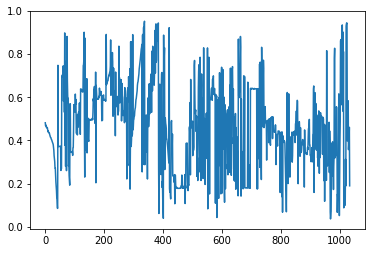

In [102]:
df2['xmid'].plot()

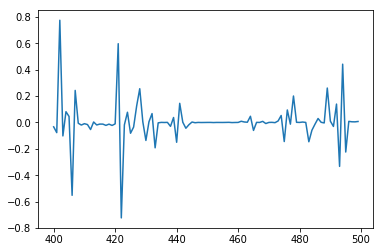

In [103]:
df2['xmin_c'][400:500].plot()

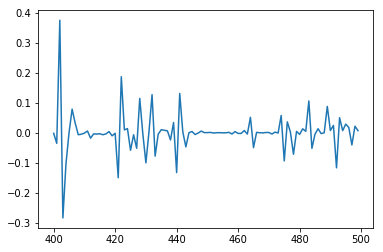

In [104]:
df2['ymin_c'][400:500].plot()

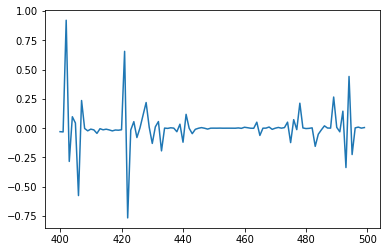

In [105]:
df2['xmax_c'][400:500].plot()

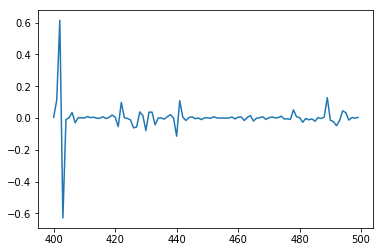

In [106]:
df2['ymax_c'][400:500].plot()

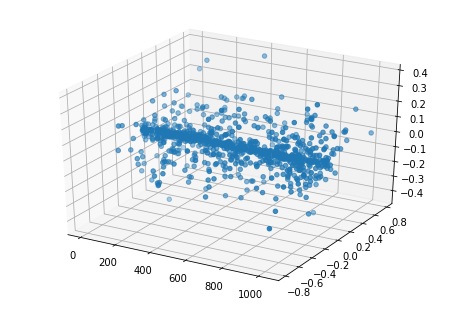

In [107]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time, df2['xmin_c'], df2['ymin_c'])

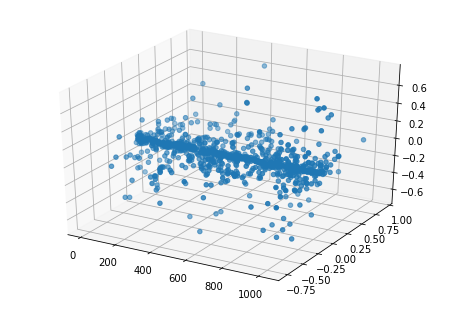

In [108]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time, df2['xmax_c'], df2['ymax_c'])

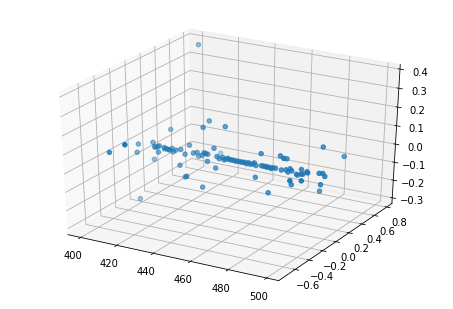

In [109]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time[400:500], df2['xmin_c'][400:500], df2['ymin_c'][400:500])

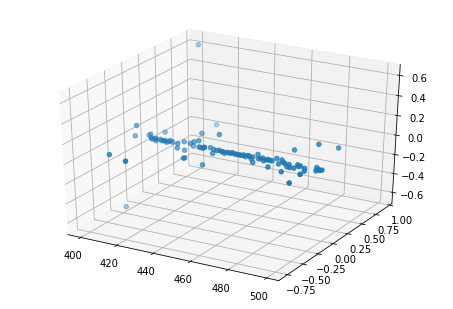

In [111]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time[400:500], df2['xmax_c'][400:500], df2['ymax_c'][400:500])

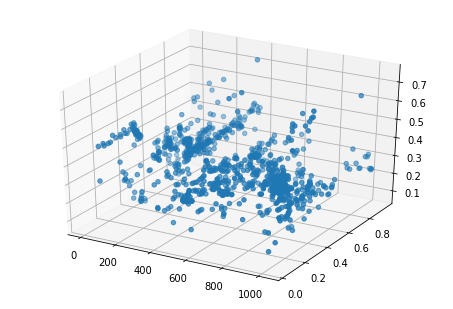

In [112]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time, df2['xmid'], df2['ymid'])

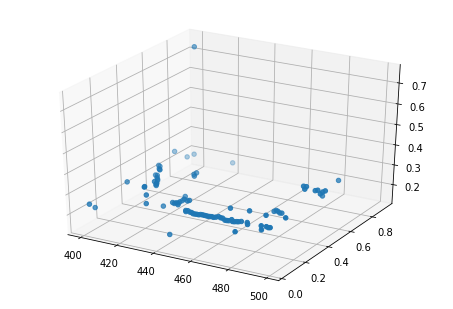

In [113]:
fig = pyplot.figure()
ax = Axes3D(fig)
ax.scatter(time[400:500], df2['xmid'][400:500], df2['ymid'][400:500])

In [ ]:
# Developing a threshold for detecting same object
# We can measure change by a norm on the changes in xmin/ymin and xmax/ymax
# Compute the distances, generate order statistics and then figure out which threshold
# bounds the points we wish to treat as similar: this would utilize a grpahical approach in judging thresholds
# a graphical approach w/ judgment isn't as amenable to automation

# After inspectin the data, the above method is insufficient because it fails to track multiple objects and confuses 
# one another, however the intution about a norm thresholding similarity is still a viable idea

In [115]:
frames[1.0][400:500]

[3117,
 3119,
 3142,
 3179,
 3192,
 3206,
 3211,
 3233,
 3234,
 3240,
 3241,
 3243,
 3252,
 3253,
 3254,
 3255,
 3256,
 3258,
 3259,
 3260,
 3261,
 3262,
 3330,
 3331,
 3644,
 3648,
 3907,
 4242,
 4253,
 4255,
 4261,
 4265,
 4275,
 4282,
 4283,
 4284,
 4287,
 4288,
 4293,
 4295,
 4298,
 4309,
 4310,
 4318,
 4322,
 4328,
 4336,
 4337,
 4350,
 4351,
 4356,
 4359,
 4410,
 4411,
 4412,
 4413,
 4414,
 4415,
 4416,
 4417,
 4418,
 4419,
 4470,
 4472,
 4476,
 4480,
 4481,
 4482,
 4483,
 4484,
 4485,
 4486,
 4487,
 4496,
 4513,
 4532,
 4547,
 4548,
 4570,
 4571,
 4572,
 4574,
 4578,
 4579,
 4583,
 4586,
 4587,
 4594,
 4596,
 4601,
 4605,
 4606,
 4610,
 4625,
 4631,
 4638,
 4640,
 4642,
 4644,
 4646]

In [ ]:

#Naming Objects

obj = 1.0

indices = frames[obj]
num = 0
curr = {'xmin': 0, 'xmax': 0, 'ymin': 0, 'ymax': 0}
names = {}

for i in indices:
#     print(i)
    entry = ground[str(i)]
#     print(entry)
#     print('')
    
    k = 1
    while (entry[str(k)]['Class'] != obj):
        k = k + 1
    data = entry[str(k)]
    
#     #
#     diff = 0
#     threshold = 100
    
    curr['xmin'] = data['xmin']
    curr['xmax'] = data['xmax']
    curr['ymin'] = data['ymin']
    curr['ymax'] = data['ymax']
    
#     if (#diff below threshold):
#         name = 'obj-' + str(num)
#         names[name].append(i)
        
#     else:
#         num = num + 1
#         name = 'obj-' + str(num)
#         names[name] = [i]

In [159]:
imputations = {}
threshold = 20
for k in range(threshold + 1):
    print(k)
    if k < 2:
        continue
    imp = {}
    for obj_class in classes:
#         print(obj_class)
        to_impute = []
        detected_frames = frames[obj_class]
        for frame in detected_frames:
            next_frame = int(frame) + 1
            for i in range(next_frame, next_frame + threshold):
                if i in detected_frames:
                    if i != next_frame:
                        for j in range(next_frame, i):
                            to_impute.append(j)
                    break

        imp[obj_class] = to_impute
    name = str(k) + '-Frame'
    imputations[name] = imp
#     print(imputations)
imputations

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


{'10-Frame': {1.0: [54,
   55,
   56,
   57,
   60,
   61,
   62,
   63,
   64,
   66,
   69,
   70,
   72,
   74,
   75,
   76,
   77,
   86,
   87,
   88,
   89,
   93,
   94,
   95,
   106,
   299,
   300,
   301,
   302,
   303,
   304,
   305,
   306,
   307,
   308,
   309,
   310,
   311,
   312,
   314,
   318,
   319,
   320,
   321,
   322,
   323,
   324,
   393,
   394,
   395,
   429,
   430,
   431,
   432,
   433,
   434,
   435,
   436,
   437,
   438,
   439,
   440,
   442,
   443,
   444,
   445,
   447,
   449,
   450,
   451,
   452,
   453,
   454,
   455,
   456,
   457,
   459,
   460,
   461,
   462,
   463,
   603,
   604,
   656,
   657,
   658,
   659,
   660,
   661,
   662,
   663,
   664,
   665,
   666,
   667,
   668,
   670,
   671,
   672,
   673,
   674,
   675,
   676,
   677,
   678,
   679,
   680,
   681,
   682,
   683,
   684,
   686,
   687,
   688,
   690,
   691,
   692,
   693,
   695,
   697,
   698,
   699,
   771,
   772,
   773,
   774,

In [162]:
for key in imputations:
    print(key)
    print(imputations[key][5.0])
    print('')


2-Frame
[584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 5864, 5865, 5866, 5867, 5868, 5869, 5870, 5871, 5872, 5873, 5874, 5875, 5876, 5877, 5878, 5881, 5883, 5884, 5885, 5886, 5888, 5889, 6815, 6817, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6827, 6828, 6829, 6830, 6831, 6833, 12630, 12631, 12632, 12633, 12634, 12635, 12636, 12637, 12638, 12639, 12640, 12641, 12642, 12643, 12644, 12645, 12646]

3-Frame
[584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 5864, 5865, 5866, 5867, 5868, 5869, 5870, 5871, 5872, 5873, 5874, 5875, 5876, 5877, 5878, 5881, 5883, 5884, 5885, 5886, 5888, 5889, 6815, 6817, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6827, 6828, 6829, 6830, 6831, 6833, 12630, 12631, 12632, 12633, 12634, 12635, 12636, 12637, 12638, 12639, 12640, 12641, 12642, 12643, 12644, 12645, 12646]

4-Frame
[584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 

In [68]:
structured_imputations = {}
for obj_class in classes:
    print(obj_class)
    d = {}
    for key in imputations:
        d[key] = imputations[key][obj_class]
    structured_imputations[obj_class] = d
    
structured_imputations

1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0
13.0
14.0
15.0
16.0
17.0
18.0
21.0
23.0
27.0
28.0
31.0
32.0
33.0
38.0
39.0
43.0
44.0
47.0
51.0
62.0
64.0
65.0
72.0
74.0
76.0
78.0
81.0
85.0
90.0


{1.0: {'10-Frame': [54,
   55,
   56,
   57,
   60,
   61,
   62,
   63,
   64,
   66,
   69,
   70,
   72,
   74,
   75,
   76,
   77,
   86,
   87,
   88,
   89,
   93,
   94,
   95,
   93,
   94,
   95,
   106,
   299,
   300,
   301,
   302,
   303,
   304,
   305,
   306,
   307,
   308,
   309,
   310,
   311,
   312,
   314,
   318,
   319,
   320,
   321,
   322,
   323,
   324,
   393,
   394,
   395,
   429,
   430,
   431,
   432,
   433,
   434,
   435,
   436,
   437,
   438,
   439,
   440,
   429,
   430,
   431,
   432,
   433,
   434,
   435,
   436,
   437,
   438,
   439,
   440,
   442,
   443,
   444,
   445,
   447,
   449,
   450,
   451,
   452,
   453,
   454,
   455,
   456,
   457,
   459,
   460,
   461,
   462,
   463,
   603,
   604,
   656,
   657,
   658,
   659,
   660,
   661,
   662,
   663,
   664,
   665,
   666,
   667,
   668,
   670,
   671,
   672,
   673,
   674,
   675,
   676,
   677,
   678,
   679,
   680,
   681,
   682,
   683,
   684,
  

In [151]:
structured_imputations

{1.0: {'10-Frame': [54,
   55,
   56,
   57,
   60,
   61,
   62,
   63,
   64,
   66,
   69,
   70,
   72,
   74,
   75,
   76,
   77,
   86,
   87,
   88,
   89,
   93,
   94,
   95,
   93,
   94,
   95,
   106,
   299,
   300,
   301,
   302,
   303,
   304,
   305,
   306,
   307,
   308,
   309,
   310,
   311,
   312,
   314,
   318,
   319,
   320,
   321,
   322,
   323,
   324,
   393,
   394,
   395,
   429,
   430,
   431,
   432,
   433,
   434,
   435,
   436,
   437,
   438,
   439,
   440,
   429,
   430,
   431,
   432,
   433,
   434,
   435,
   436,
   437,
   438,
   439,
   440,
   442,
   443,
   444,
   445,
   447,
   449,
   450,
   451,
   452,
   453,
   454,
   455,
   456,
   457,
   459,
   460,
   461,
   462,
   463,
   603,
   604,
   656,
   657,
   658,
   659,
   660,
   661,
   662,
   663,
   664,
   665,
   666,
   667,
   668,
   670,
   671,
   672,
   673,
   674,
   675,
   676,
   677,
   678,
   679,
   680,
   681,
   682,
   683,
   684,
  

In [101]:
x = []
count = 0
for image in ground: 
    x.append(count)
    count = count + 1
    
x

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [132]:
frame_2 = []
frame_3 = []
frame_4 = []
frame_5 = []
frame_6 = []
frame_7 = []
frame_8 = []
frame_9 = []
frame_10 = []
frame_11 = []
frame_12 = []
frame_13 = []
frame_14 = []
frame_15 = []
frame_16 = []
frame_17 = []
frame_18 = []
frame_19 = []
frame_20 = []

names = [frame_2, frame_3, frame_4, frame_5, frame_6, frame_7, frame_8, frame_9, frame_10, frame_11, 
         frame_12, frame_13, frame_14, frame_15, frame_16, frame_17, frame_18, frame_19, frame_20]

count = 2
frame_dict = {}
df2 = pd.DataFrame()
df2['Time'] = x
for name in names:
    ref = str(count) + '-Frame'
    print(ref)
    for image in ground:
        if int(image) in structured_imputations[1.0][ref]:
            name.append(1)
        else:
            name.append(0)
    frame_dict[ref] = name
    df2[ref] = name
    print(df2)
    count = count + 1
df2

2-Frame
        Time  2-Frame
0          0        0
1          1        0
2          2        0
3          3        0
4          4        0
5          5        0
6          6        0
7          7        0
8          8        0
9          9        0
10        10        0
11        11        0
12        12        0
13        13        0
14        14        0
15        15        0
16        16        0
17        17        0
18        18        0
19        19        0
20        20        0
21        21        0
22        22        0
23        23        0
24        24        0
25        25        0
26        26        0
27        27        0
28        28        0
29        29        0
...      ...      ...
12734  12734        0
12735  12735        0
12736  12736        0
12737  12737        0
12738  12738        0
12739  12739        0
12740  12740        0
12741  12741        0
12742  12742        0
12743  12743        0
12744  12744        0
12745  12745        0
12746  12746        0
12

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame
0          0        0        0        0        0        0
1          1        0        0        0        0        0
2          2        0        0        0        0        0
3          3        0        0        0        0        0
4          4        0        0        0        0        0
5          5        0        0        0        0        0
6          6        0        0        0        0        0
7          7        0        0        0        0        0
8          8        0        0        0        0        0
9          9        0        0        0        0        0
10        10        0        0        0        0        0
11        11        0        0        0        0        0
12        12        0        0        0        0        0
13        13        0        0        0        0        0
14        14        0        0        0        0        0
15        15        0        0        0        0        0
16        16  

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

        Time  2-Frame  3-Frame  4-Frame  5-Frame  6-Frame  7-Frame  8-Frame  \
0          0        0        0        0        0        0        0        0   
1          1        0        0        0        0        0        0        0   
2          2        0        0        0        0        0        0        0   
3          3        0        0        0        0        0        0        0   
4          4        0        0        0        0        0        0        0   
5          5        0        0        0        0        0        0        0   
6          6        0        0        0        0        0        0        0   
7          7        0        0        0        0        0        0        0   
8          8        0        0        0        0        0        0        0   
9          9        0        0        0        0        0        0        0   
10        10        0        0        0        0        0        0        0   
11        11        0        0        0        0    

,Time,2-Frame,3-Frame,4-Frame,5-Frame,6-Frame,7-Frame,8-Frame,9-Frame,10-Frame,11-Frame,12-Frame,13-Frame,14-Frame,15-Frame,16-Frame,17-Frame,18-Frame,19-Frame,20-Frame
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [133]:
df2.describe()

,Time,2-Frame,3-Frame,4-Frame,5-Frame,6-Frame,7-Frame,8-Frame,9-Frame,10-Frame,11-Frame,12-Frame,13-Frame,14-Frame,15-Frame,16-Frame,17-Frame,18-Frame,19-Frame,20-Frame
count,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000,12764.000000
mean,6381.500000,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172,0.200172
std,3684.793753,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145,0.400145
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3190.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,6381.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9572.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,12763.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [134]:
names

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  0,
  0,
  1,
  1,
  0,
  1,
  0,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


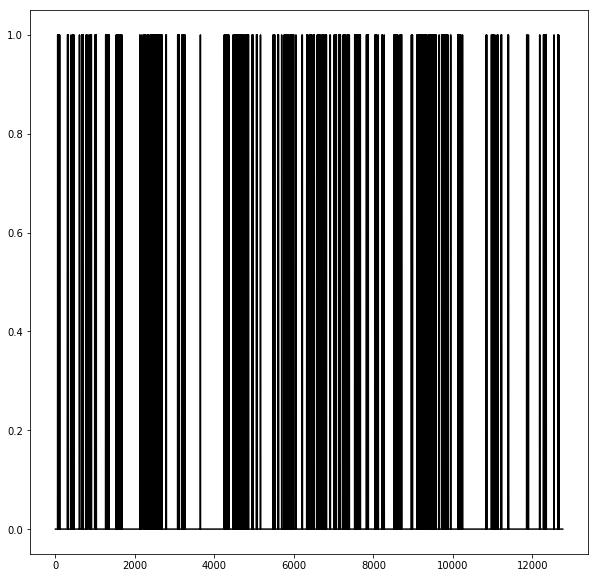

In [146]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
plt.plot( 'Time', '2-Frame', data=df2, color='black')

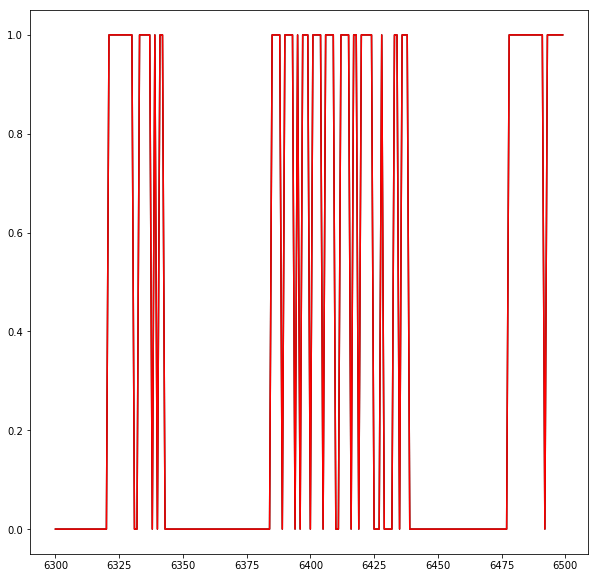

In [150]:
plt.plot('Time', '20-Frame', data=df2[6300:6500], color='black')
plt.plot('Time', '2-Frame', data=df2[6300:6500], color='red')

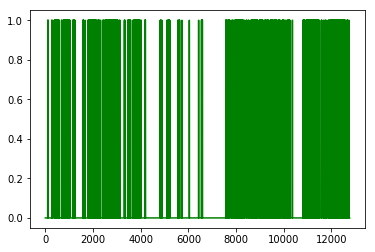

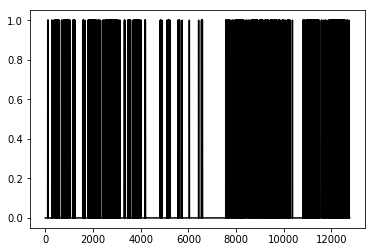